In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/skin-cancer-mnist-ham10000/hmnist_8_8_RGB.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_RGB.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_8_8_L.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_L.csv
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028933.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028394.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0027799.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028100.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0027960.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028872.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0026412.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0024872.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000

dx
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64


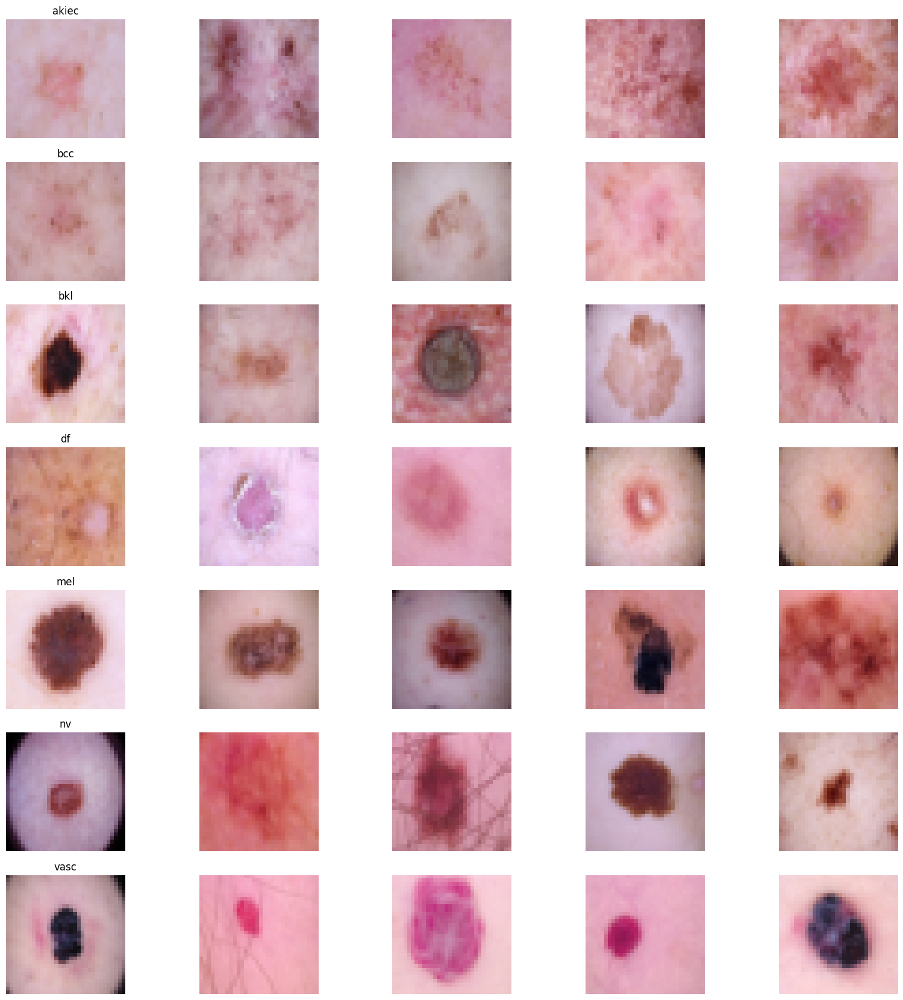

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
from PIL import Image

# Load the metadata CSV file
skin_df = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

# Map image file paths based on the image IDs in the CSV file
image_path = {os.path.splitext(os.path.basename(x))[0]: x
              for x in glob('/kaggle/input/skin-cancer-mnist-ham10000/*/*.jpg')}

# Add the image paths to the DataFrame as a new column
skin_df['path'] = skin_df['image_id'].map(image_path.get)

# Load images into the DataFrame; this resizes each to 32x32 pixels
skin_df['image'] = skin_df['path'].map(lambda x: np.asarray(Image.open(x).resize((32,32))))

# Display counts of each label type
print(skin_df['dx'].value_counts())

# Plot sample images from each class
n_samples = 5  # Number of images to display per class
fig, m_axs = plt.subplots(7, n_samples, figsize=(4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         skin_df.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')
plt.show()

In [3]:
!pip install autokeras 

import autokeras as ak
print("AutoKeras successfully imported!")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.7/122.7 kB 3.8 MB/s eta 0:00:00
AutoKeras successfully imported!


Trial 30 Complete [00h 00m 09s]
val_loss: 1.2265613079071045

Best val_loss So Far: 1.084046721458435
Total elapsed time: 00h 11m 46s
Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 501ms/step - accuracy: 0.1444 - loss: 2.0944
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0870 - loss: 1.9847 
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2008 - loss: 1.9148 
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2064 - loss: 1.8923 
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2395 - loss: 1.8557 
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2421 - loss: 1.8238 
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2792 - loss: 1.7723 
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3520 - loss: 1.7153 
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3225 - loss: 1.6990 
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3811 - loss: 1.6663 
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - accuracy: 0.4652 - loss: 1.8323
Accuracy = 46.71%


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 32, 32, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_to_float32 (CastToFloat32)      │ (None, 32, 32, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 30, 30, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 28, 28, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12544)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 12544)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 7)                   │          87,815 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ classification_head_1 (Softmax)      │ (None, 7)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 107,207 (418.78 KB)

 Trainable params: 107,207 (418.78 KB)

 Non-trainable params: 0 (0.00 B)

None
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - accuracy: 0.4652 - loss: 1.8323
Test accuracy: 0.46706587076187134


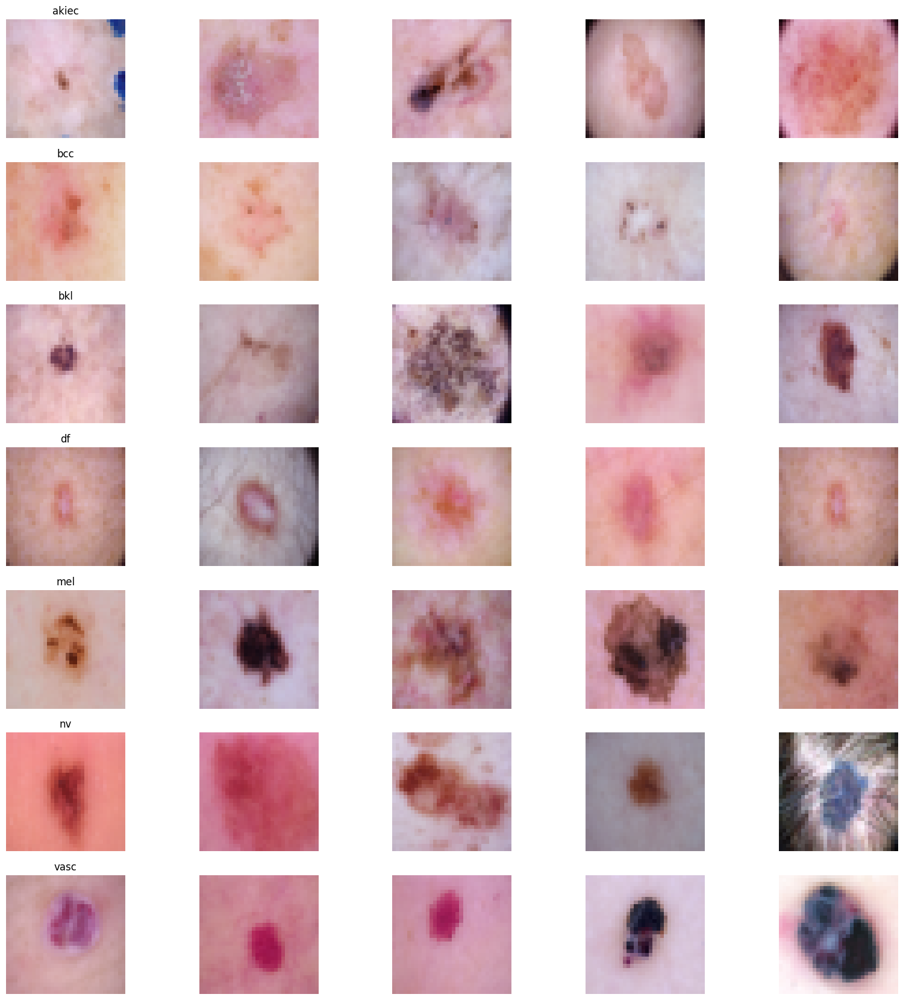

In [4]:
# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import resample
from scipy import stats
import autokeras as ak
from tensorflow.keras.utils import to_categorical  # Updated import

# Set file path
# Modify this path to the correct location where your dataset is stored
file_path = '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv'

# Verify the file exists
if not os.path.exists(file_path):
    raise FileNotFoundError(f"The file '{file_path}' does not exist. Please verify the path.")

# Load dataset
skin_df = pd.read_csv(file_path)

# Set image size
SIZE = 32

# Label encoding to numeric values
le = LabelEncoder()
le.fit(skin_df['dx'])
skin_df['label'] = le.transform(skin_df["dx"])

# Display sample data
print(skin_df.sample(10))

# Data distribution visualization
fig = plt.figure(figsize=(15, 10))

ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type')

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count')
ax2.set_title('Sex')

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count')
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.histplot(sample_age['age'], kde=True, color='red')
ax4.set_title('Age Distribution')

plt.tight_layout()
plt.show()

# Distribution of data into various classes
print(skin_df['label'].value_counts())

# Balance the dataset
n_samples = 500  # Number of samples per class
df_list = []
for label in skin_df['label'].unique():
    df = skin_df[skin_df['label'] == label]
    df_resampled = resample(df, replace=True, n_samples=n_samples, random_state=42)
    df_list.append(df_resampled)

skin_df_balanced = pd.concat(df_list)
print(skin_df_balanced['label'].value_counts())

# Map image paths
image_path = {
    os.path.splitext(os.path.basename(x))[0]: x
    for x in glob(os.path.join('/kaggle/input/skin-cancer-mnist-ham10000/', '*', '*.jpg'))
}
skin_df_balanced['path'] = skin_df_balanced['image_id'].map(image_path.get)

# Verify all paths exist
missing_paths = skin_df_balanced[skin_df_balanced['path'].isnull()]
if not missing_paths.empty:
    print("Warning: Some image paths are missing!")

skin_df_balanced['image'] = skin_df_balanced['path'].map(
    lambda x: np.asarray(Image.open(x).resize((SIZE, SIZE)))
)

# Plot sample images
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
for n_axs, (type_name, type_rows) in zip(
    m_axs, skin_df_balanced.sort_values(['dx']).groupby('dx')
):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

# Prepare data for model training
X = np.asarray(skin_df_balanced['image'].tolist()) / 255.0  # Normalize images
Y = skin_df_balanced['label']
Y_cat = to_categorical(Y, num_classes=7)  # One-hot encode labels

# Split the data
x_train_auto, x_test_auto, y_train_auto, y_test_auto = train_test_split(
    X, Y_cat, test_size=0.95, random_state=42
)
x_unused, x_valid, y_unused, y_valid = train_test_split(
    x_test_auto, y_test_auto, test_size=0.05, random_state=42
)

# Define AutoKeras classifier
clf = ak.ImageClassifier(max_trials=30)  # MaxTrials: Number of models to try
clf.fit(x_train_auto, y_train_auto, epochs=50)

# Evaluate the classifier on the validation set
_, acc = clf.evaluate(x_valid, y_valid)
print(f"Accuracy = {acc * 100:.2f}%")

# Get the best-performing model
model = clf.export_model()
print(model.summary())

# Save the model
model.save('cifar_model.h5')

# Evaluate on validation set
score = model.evaluate(x_valid, y_valid)
print('Test accuracy:', score[1])

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
        lesion_id      image_id   dx    dx_type   age     sex  \
1617  HAM_0007180  ISIC_0033272  mel      histo  65.0    male   
8128  HAM_0007195  ISIC_0031923   nv      histo  40.0  female   
2168  HAM_0001835  ISIC_0026652  mel      histo  65.0    male   
1090  HAM_0000465  ISIC_0030583  bkl  consensus  35.0  female   
7754  HAM_0001720  ISIC_0034010   nv      histo  45.0    male   
8071  HAM_0006333  ISIC_0024424   nv      histo  35.0    male   
7423  HAM_0004548  ISIC_0032832   nv      histo  45.0  female   
8984  HAM_0006526  ISIC_0026671   nv      histo  55.0    male   
2310  HAM_0003102  ISIC_0032389  mel      histo  65.0    male   
7256  HAM_0004260  ISIC_0025525   nv      histo  65.0    male   

         localization  label  
1617             face      4  
8128  lower extremity      5  
2168             back      4  
1090            trunk      2  
7754          abdomen      5  
8071            trunk      5  
7423  upper extr

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


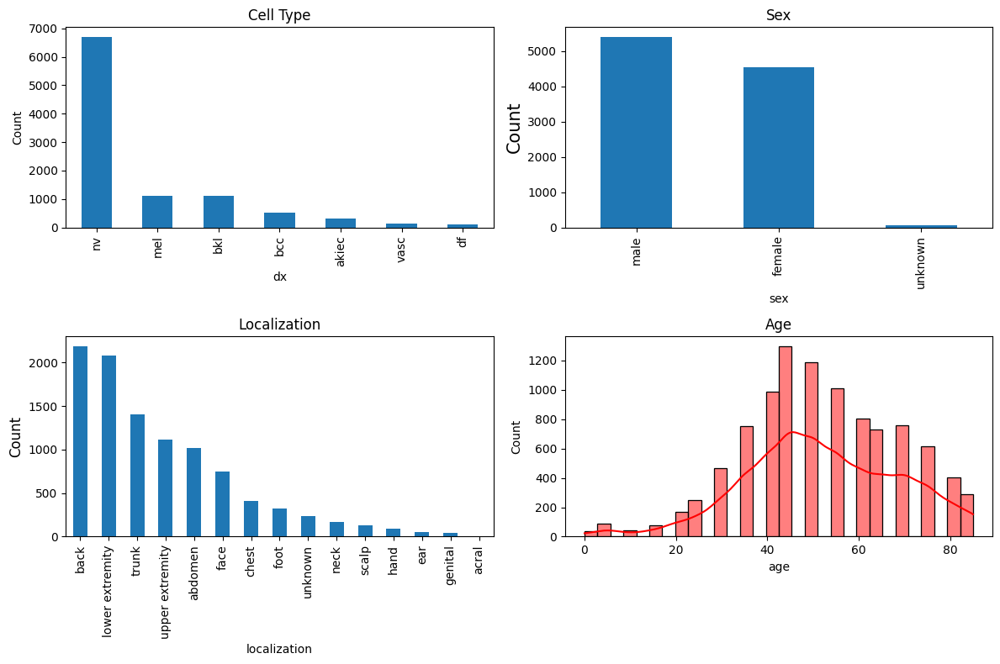

label
0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: count, dtype: int64
Image 0 shape: (32, 32, 3)
Image 1 shape: (32, 32, 3)
Image 2 shape: (32, 32, 3)
Image 3 shape: (32, 32, 3)
Image 4 shape: (32, 32, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 30, 30, 256)         │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 15, 15, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 15, 15, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 13, 13, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 6, 6, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 6, 6, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 4, 4, 64)            │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 2, 2, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 2, 2, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           8,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 7)                   │             231 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 384,455 (1.47 MB)

 Trainable params: 384,455 (1.47 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
165/165 - 12s - 70ms/step - acc: 0.1817 - loss: 1.9145 - val_acc: 0.2457 - val_loss: 1.8132
Epoch 2/50
165/165 - 1s - 4ms/step - acc: 0.2606 - loss: 1.7825 - val_acc: 0.2503 - val_loss: 1.7842
Epoch 3/50
165/165 - 1s - 4ms/step - acc: 0.2987 - loss: 1.6876 - val_acc: 0.3063 - val_loss: 1.5921
Epoch 4/50
165/165 - 1s - 4ms/step - acc: 0.3630 - loss: 1.5712 - val_acc: 0.3783 - val_loss: 1.4949
Epoch 5/50
165/165 - 1s - 4ms/step - acc: 0.4145 - loss: 1.4609 - val_acc: 0.4423 - val_loss: 1.4131
Epoch 6/50
165/165 - 1s - 4ms/step - acc: 0.4377 - loss: 1.4103 - val_acc: 0.4240 - val_loss: 1.3822
Epoch 7/50
165/165 - 1s - 4ms/step - acc: 0.4632 - loss: 1.3767 - val_acc: 0.4754 - val_loss: 1.3569
Epoch 8/50
165/165 - 1s - 4ms/step - acc: 0.4865 - loss: 1.3241 - val_acc: 0.4309 - val_loss: 1.4039
Epoch 9/50
165/165 - 1s - 4ms/step - acc: 0.4476 - loss: 1.4405 - val_acc: 0.4354 - val_loss: 1.3759
Epoch 10/50
165/165 - 1s - 4ms/step - acc: 0.4830 - loss: 1.3187 - val_acc: 0.4571 - val_

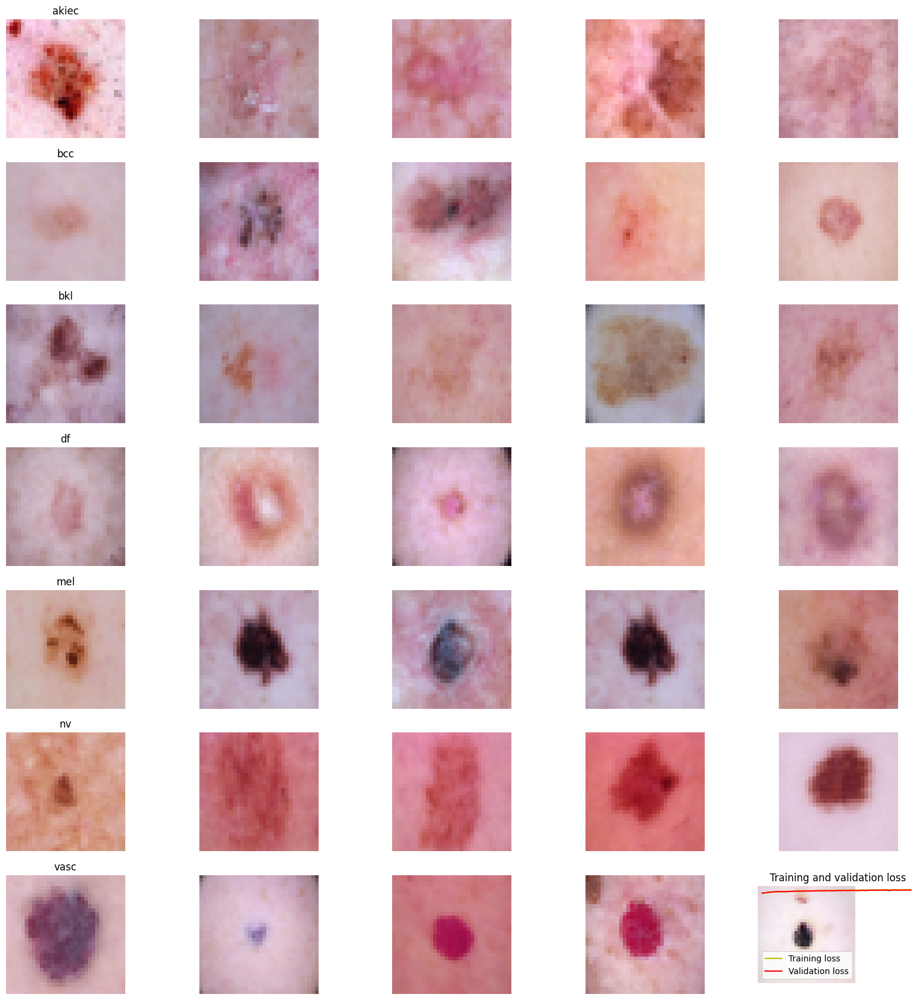

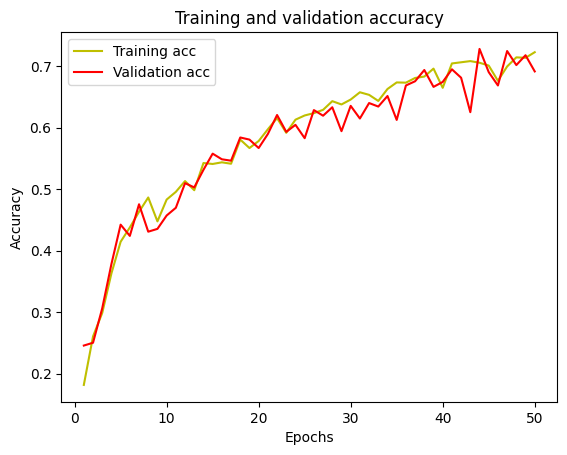

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


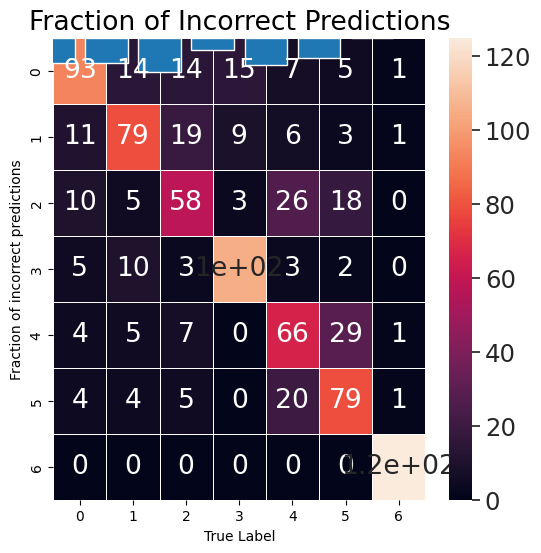

In [5]:
#size=32,loss='categorical_crossentropy', optimizer='Adam',batch_size = 16,epochs = 50.
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image

np.random.seed(42)
from sklearn.metrics import confusion_matrix

import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

skin_df = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

SIZE = 32

# Label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
print(list(le.classes_))

skin_df['label'] = le.transform(skin_df["dx"])
print(skin_df.sample(10))

# Data distribution visualization
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type')

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex')

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count', size=12)
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.histplot(sample_age['age'], kde=True, color='red', bins=30)
ax4.set_title('Age')

plt.tight_layout()
plt.show()

# Balancing data
n_samples = 500
df_balanced = []
for label in range(7):
    df_label = skin_df[skin_df['label'] == label]
    df_balanced.append(resample(df_label, replace=True, n_samples=n_samples, random_state=42))

skin_df_balanced = pd.concat(df_balanced)
print(skin_df_balanced['label'].value_counts())

# Reading images based on image ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x
               for x in glob(os.path.join('/kaggle/input/skin-cancer-mnist-ham10000/', '*', '*.jpg'))}

skin_df_balanced['path'] = skin_df_balanced['image_id'].map(image_path.get)

# Check for missing paths
missing_paths = skin_df_balanced[skin_df_balanced['path'].isnull()]
if not missing_paths.empty:
    print("Missing image paths for the following image IDs:")
    print(missing_paths['image_id'])

# Use the path to read images, handling None values
def load_image(x):
    if x is not None and os.path.exists(x):
        try:
            img = Image.open(x).resize((SIZE, SIZE))
            return np.asarray(img)
        except Exception as e:
            print(f"Error loading image {x}: {e}")
            return np.zeros((SIZE, SIZE, 3))
    else:
        return np.zeros((SIZE, SIZE, 3))  # Return a zero array for missing images

skin_df_balanced['image'] = skin_df_balanced['path'].map(load_image)

# Check if images are loaded correctly
for i, img in enumerate(skin_df_balanced['image'][:5]):
    if img.sum() == 0:
        print(f"Image {i} is black (all zeros)")
    else:
        print(f"Image {i} shape: {img.shape}")

# Plotting
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
for n_axs, (type_name, type_rows) in zip(m_axs, skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

# Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X / 255.  # Scale values to 0-1
Y = skin_df_balanced['label']
Y_cat = to_categorical(Y, num_classes=7)

# Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

# Define the model
model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Flatten())

model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=['acc'])

# Train the model
batch_size = 16
epochs = 50

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_test, y_test),
    verbose=2)

score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

# Plotting training and validation accuracy and loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(loss) + 1)
plt.plot(epochs_range, loss, 'y', label='Training loss')
plt.plot(epochs_range, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs_range, acc, 'y', label='Training acc')
plt.plot(epochs_range, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Prediction on test data
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

# Plot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')
plt.title('Fraction of Incorrect Predictions')
plt.show()

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
        lesion_id      image_id   dx    dx_type   age     sex  \
1617  HAM_0007180  ISIC_0033272  mel      histo  65.0    male   
8128  HAM_0007195  ISIC_0031923   nv      histo  40.0  female   
2168  HAM_0001835  ISIC_0026652  mel      histo  65.0    male   
1090  HAM_0000465  ISIC_0030583  bkl  consensus  35.0  female   
7754  HAM_0001720  ISIC_0034010   nv      histo  45.0    male   
8071  HAM_0006333  ISIC_0024424   nv      histo  35.0    male   
7423  HAM_0004548  ISIC_0032832   nv      histo  45.0  female   
8984  HAM_0006526  ISIC_0026671   nv      histo  55.0    male   
2310  HAM_0003102  ISIC_0032389  mel      histo  65.0    male   
7256  HAM_0004260  ISIC_0025525   nv      histo  65.0    male   

         localization  label  
1617             face      4  
8128  lower extremity      5  
2168             back      4  
1090            trunk      2  
7754          abdomen      5  
8071            trunk      5  
7423  upper extr

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


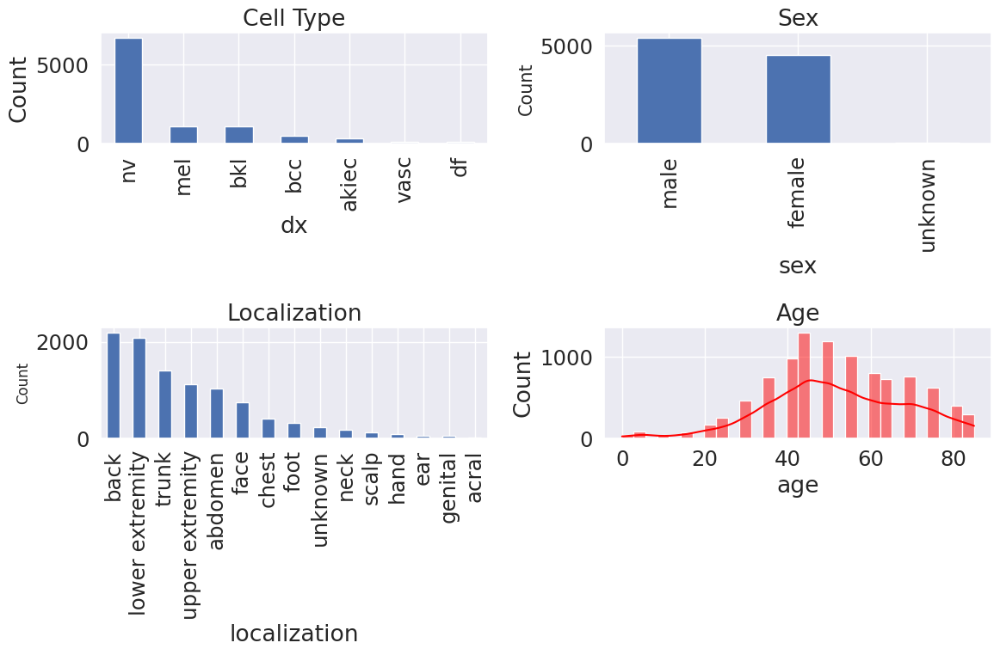

label
0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: count, dtype: int64
Image 0 shape: (32, 32, 3)
Image 1 shape: (32, 32, 3)
Image 2 shape: (32, 32, 3)
Image 3 shape: (32, 32, 3)
Image 4 shape: (32, 32, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 30, 30, 256)         │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 15, 15, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 15, 15, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 13, 13, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 6, 6, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 6, 6, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 4, 4, 64)            │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 2, 2, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 2, 2, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 32)                  │           8,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 7)                   │             231 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 384,455 (1.47 MB)

 Trainable params: 384,455 (1.47 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
165/165 - 9s - 55ms/step - acc: 0.1996 - loss: 1.8907 - val_acc: 0.2320 - val_loss: 1.7863
Epoch 2/50
165/165 - 1s - 5ms/step - acc: 0.2777 - loss: 1.7401 - val_acc: 0.2994 - val_loss: 1.6766
Epoch 3/50
165/165 - 1s - 4ms/step - acc: 0.3547 - loss: 1.5591 - val_acc: 0.3851 - val_loss: 1.5510
Epoch 4/50
165/165 - 1s - 4ms/step - acc: 0.3966 - loss: 1.4852 - val_acc: 0.3520 - val_loss: 1.5778
Epoch 5/50
165/165 - 1s - 4ms/step - acc: 0.4556 - loss: 1.4053 - val_acc: 0.4274 - val_loss: 1.4091
Epoch 6/50
165/165 - 1s - 4ms/step - acc: 0.4499 - loss: 1.3590 - val_acc: 0.4389 - val_loss: 1.3501
Epoch 7/50
165/165 - 1s - 4ms/step - acc: 0.4651 - loss: 1.3297 - val_acc: 0.4766 - val_loss: 1.2820
Epoch 8/50
165/165 - 1s - 4ms/step - acc: 0.4922 - loss: 1.2660 - val_acc: 0.4480 - val_loss: 1.3346
Epoch 9/50
165/165 - 1s - 4ms/step - acc: 0.5105 - loss: 1.2352 - val_acc: 0.4629 - val_loss: 1.2576
Epoch 10/50
165/165 - 1s - 4ms/step - acc: 0.5109 - loss: 1.2465 - val_acc: 0.4674 - val_l

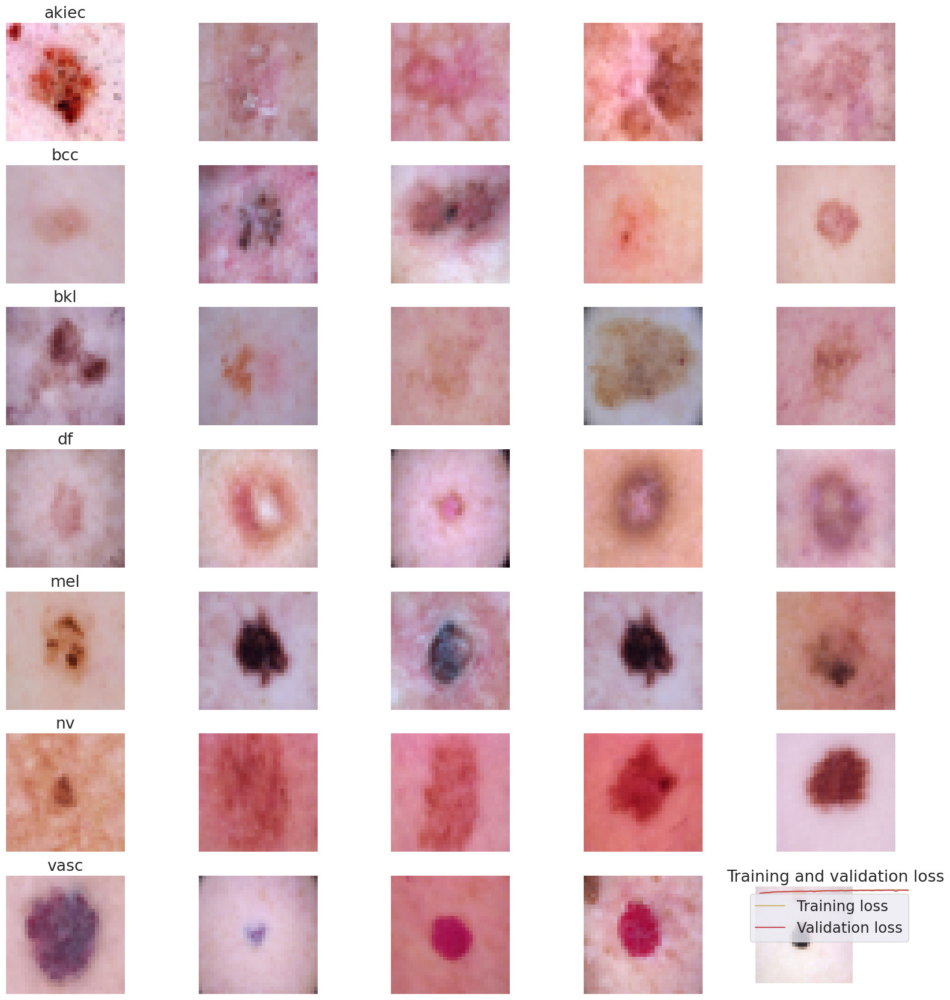

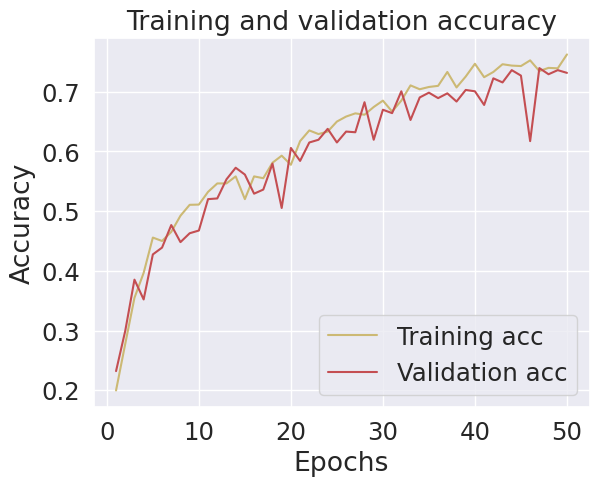

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


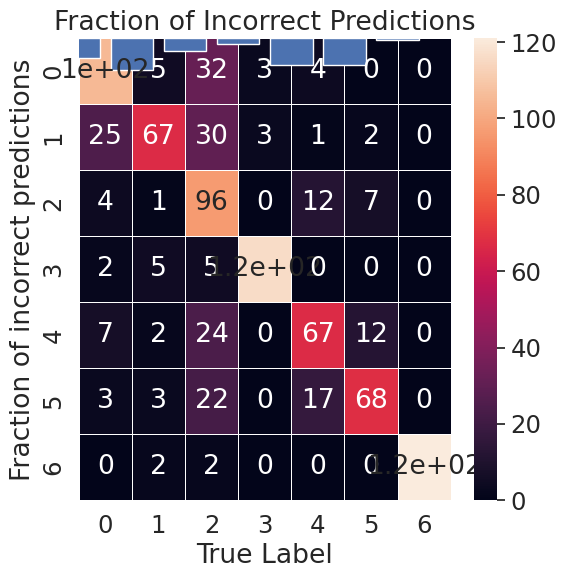

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
from sklearn.utils import resample  # Added this import

np.random.seed(42)
from sklearn.metrics import confusion_matrix

import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

skin_df = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

SIZE = 32

# Label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
print(list(le.classes_))

skin_df['label'] = le.transform(skin_df["dx"])
print(skin_df.sample(10))

# Data distribution visualization
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type')

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex')

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count', size=12)
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.histplot(sample_age['age'], kde=True, color='red', bins=30)
ax4.set_title('Age')

plt.tight_layout()
plt.show()

# Balancing data
n_samples = 500
df_balanced = []
for label in range(7):
    df_label = skin_df[skin_df['label'] == label]
    df_balanced.append(resample(df_label, replace=True, n_samples=n_samples, random_state=42))

skin_df_balanced = pd.concat(df_balanced)
print(skin_df_balanced['label'].value_counts())

# Reading images based on image ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x
               for x in glob(os.path.join('/kaggle/input/skin-cancer-mnist-ham10000/', '*', '*.jpg'))}

skin_df_balanced['path'] = skin_df_balanced['image_id'].map(image_path.get)

# Check for missing paths
missing_paths = skin_df_balanced[skin_df_balanced['path'].isnull()]
if not missing_paths.empty:
    print("Missing image paths for the following image IDs:")
    print(missing_paths['image_id'])

# Use the path to read images, handling None values
def load_image(x):
    if x is not None and os.path.exists(x):
        try:
            img = Image.open(x).resize((SIZE, SIZE))
            return np.asarray(img)
        except Exception as e:
            print(f"Error loading image {x}: {e}")
            return np.zeros((SIZE, SIZE, 3))
    else:
        return np.zeros((SIZE, SIZE, 3))  # Return a zero array for missing images

skin_df_balanced['image'] = skin_df_balanced['path'].map(load_image)

# Rest of the code remains the same...
# (Training, model definition, etc.)
# Check if images are loaded correctly
for i, img in enumerate(skin_df_balanced['image'][:5]):
    if img.sum() == 0:
        print(f"Image {i} is black (all zeros)")
    else:
        print(f"Image {i} shape: {img.shape}")

# Plotting
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
for n_axs, (type_name, type_rows) in zip(m_axs, skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

# Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X / 255.  # Scale values to 0-1
Y = skin_df_balanced['label']
Y_cat = to_categorical(Y, num_classes=7)

# Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

# Define the model
model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Flatten())

model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=['acc'])

# Train the model
batch_size = 16
epochs = 50

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_test, y_test),
    verbose=2)

score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

# Plotting training and validation accuracy and loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(loss) + 1)
plt.plot(epochs_range, loss, 'y', label='Training loss')
plt.plot(epochs_range, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs_range, acc, 'y', label='Training acc')
plt.plot(epochs_range, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Prediction on test data
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

# Plot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')
plt.title('Fraction of Incorrect Predictions')
plt.show()

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
        lesion_id      image_id   dx    dx_type   age     sex  \
1617  HAM_0007180  ISIC_0033272  mel      histo  65.0    male   
8128  HAM_0007195  ISIC_0031923   nv      histo  40.0  female   
2168  HAM_0001835  ISIC_0026652  mel      histo  65.0    male   
1090  HAM_0000465  ISIC_0030583  bkl  consensus  35.0  female   
7754  HAM_0001720  ISIC_0034010   nv      histo  45.0    male   
8071  HAM_0006333  ISIC_0024424   nv      histo  35.0    male   
7423  HAM_0004548  ISIC_0032832   nv      histo  45.0  female   
8984  HAM_0006526  ISIC_0026671   nv      histo  55.0    male   
2310  HAM_0003102  ISIC_0032389  mel      histo  65.0    male   
7256  HAM_0004260  ISIC_0025525   nv      histo  65.0    male   

         localization  label  
1617             face      4  
8128  lower extremity      5  
2168             back      4  
1090            trunk      2  
7754          abdomen      5  
8071            trunk      5  
7423  upper extr

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


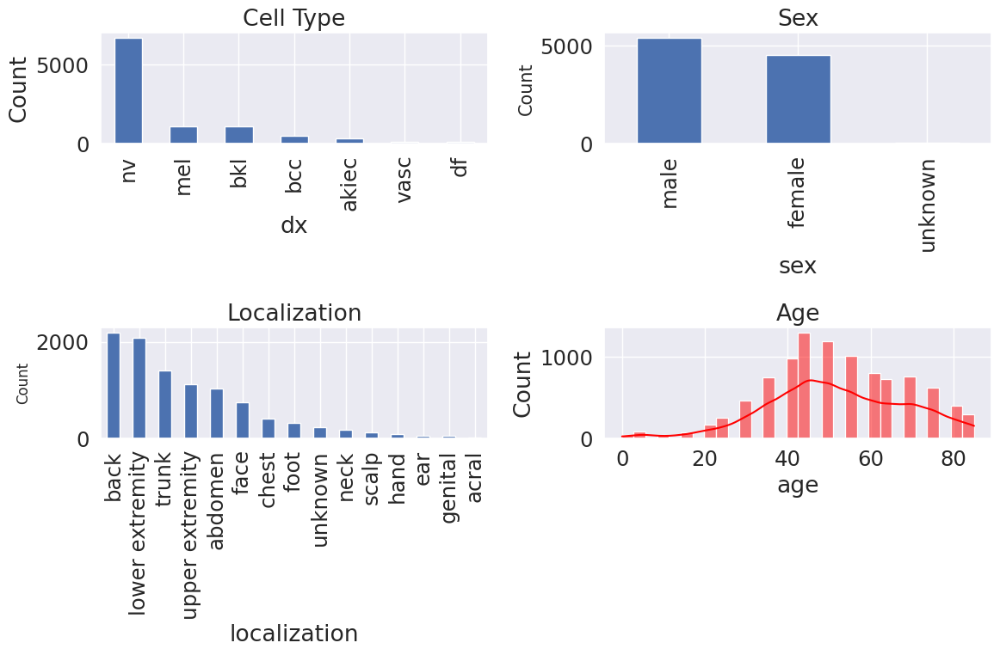

label
0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: count, dtype: int64
Image 0 shape: (64, 64, 3)
Image 1 shape: (64, 64, 3)
Image 2 shape: (64, 64, 3)
Image 3 shape: (64, 64, 3)
Image 4 shape: (64, 64, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)                    │ (None, 62, 62, 256)         │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 29, 29, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 12, 12, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 2304)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 32)                  │          73,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 7)                   │             231 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 449,991 (1.72 MB)

 Trainable params: 449,991 (1.72 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/75
132/132 - 17s - 127ms/step - acc: 0.1886 - loss: 1.8982 - val_acc: 0.2526 - val_loss: 1.8476
Epoch 2/75
132/132 - 2s - 14ms/step - acc: 0.2731 - loss: 1.7573 - val_acc: 0.2789 - val_loss: 1.7519
Epoch 3/75
132/132 - 2s - 14ms/step - acc: 0.3379 - loss: 1.6221 - val_acc: 0.3943 - val_loss: 1.5341
Epoch 4/75
132/132 - 2s - 14ms/step - acc: 0.3935 - loss: 1.4865 - val_acc: 0.4000 - val_loss: 1.4580
Epoch 5/75
132/132 - 2s - 14ms/step - acc: 0.4305 - loss: 1.4412 - val_acc: 0.4069 - val_loss: 1.4408
Epoch 6/75
132/132 - 2s - 15ms/step - acc: 0.4484 - loss: 1.3978 - val_acc: 0.4103 - val_loss: 1.4114
Epoch 7/75
132/132 - 2s - 15ms/step - acc: 0.4895 - loss: 1.3320 - val_acc: 0.4583 - val_loss: 1.3447
Epoch 8/75
132/132 - 2s - 15ms/step - acc: 0.5067 - loss: 1.2752 - val_acc: 0.4491 - val_loss: 1.3734
Epoch 9/75
132/132 - 2s - 15ms/step - acc: 0.5200 - loss: 1.2312 - val_acc: 0.4926 - val_loss: 1.2894
Epoch 10/75
132/132 - 2s - 15ms/step - acc: 0.5337 - loss: 1.1840 - val_acc: 0.5

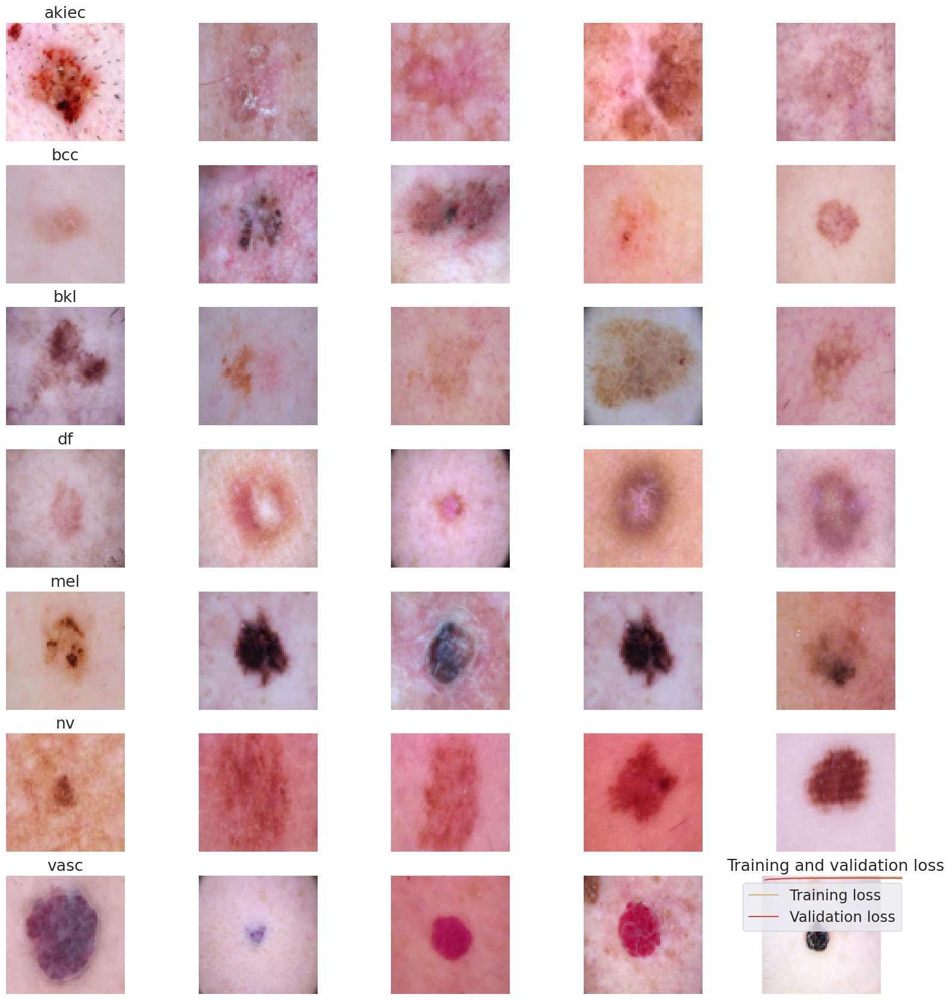

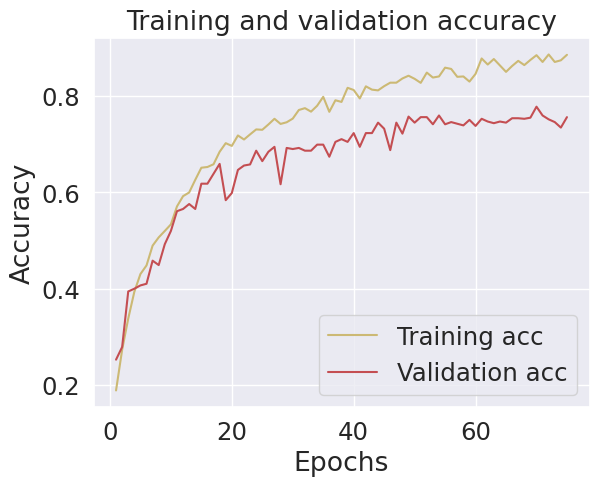

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


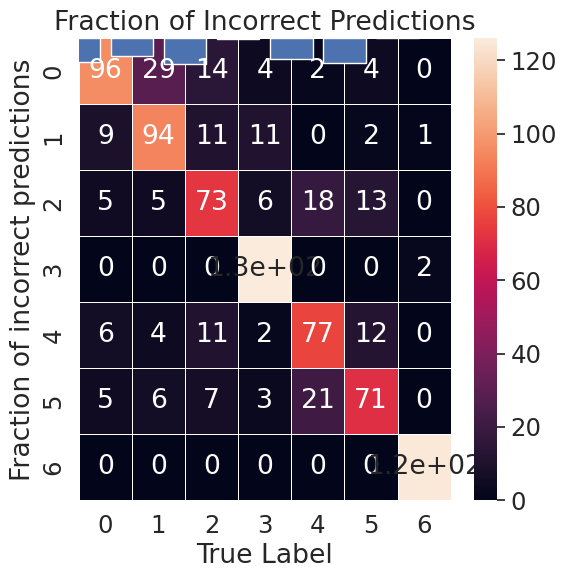

In [7]:
#size=64,batch size=20,epochs=75,optimizer='Adam',Loss Function='Categorical Crossentropy'
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
from sklearn.utils import resample  # Added this import

np.random.seed(42)
from sklearn.metrics import confusion_matrix

import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

skin_df = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

SIZE = 64

# Label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
print(list(le.classes_))

skin_df['label'] = le.transform(skin_df["dx"])
print(skin_df.sample(10))

# Data distribution visualization
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type')

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex')

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count', size=12)
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.histplot(sample_age['age'], kde=True, color='red', bins=30)
ax4.set_title('Age')

plt.tight_layout()
plt.show()

# Balancing data
n_samples = 500
df_balanced = []
for label in range(7):
    df_label = skin_df[skin_df['label'] == label]
    df_balanced.append(resample(df_label, replace=True, n_samples=n_samples, random_state=42))

skin_df_balanced = pd.concat(df_balanced)
print(skin_df_balanced['label'].value_counts())

# Reading images based on image ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x
               for x in glob(os.path.join('/kaggle/input/skin-cancer-mnist-ham10000/', '*', '*.jpg'))}

skin_df_balanced['path'] = skin_df_balanced['image_id'].map(image_path.get)

# Check for missing paths
missing_paths = skin_df_balanced[skin_df_balanced['path'].isnull()]
if not missing_paths.empty:
    print("Missing image paths for the following image IDs:")
    print(missing_paths['image_id'])

# Use the path to read images, handling None values
def load_image(x):
    if x is not None and os.path.exists(x):
        try:
            img = Image.open(x).resize((SIZE, SIZE))
            return np.asarray(img)
        except Exception as e:
            print(f"Error loading image {x}: {e}")
            return np.zeros((SIZE, SIZE, 3))
    else:
        return np.zeros((SIZE, SIZE, 3))  # Return a zero array for missing images

skin_df_balanced['image'] = skin_df_balanced['path'].map(load_image)

# Rest of the code remains the same...
# (Training, model definition, etc.)
# Check if images are loaded correctly
for i, img in enumerate(skin_df_balanced['image'][:5]):
    if img.sum() == 0:
        print(f"Image {i} is black (all zeros)")
    else:
        print(f"Image {i} shape: {img.shape}")

# Plotting
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
for n_axs, (type_name, type_rows) in zip(m_axs, skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

# Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X / 255.  # Scale values to 0-1
Y = skin_df_balanced['label']
Y_cat = to_categorical(Y, num_classes=7)

# Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

# Define the model
model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Flatten())

model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=['acc'])

# Train the model
batch_size = 20
epochs = 75

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_test, y_test),
    verbose=2)

score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

# Plotting training and validation accuracy and loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(loss) + 1)
plt.plot(epochs_range, loss, 'y', label='Training loss')
plt.plot(epochs_range, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs_range, acc, 'y', label='Training acc')
plt.plot(epochs_range, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Prediction on test data
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

# Plot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')
plt.title('Fraction of Incorrect Predictions')
plt.show()

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
        lesion_id      image_id   dx    dx_type   age     sex  \
1617  HAM_0007180  ISIC_0033272  mel      histo  65.0    male   
8128  HAM_0007195  ISIC_0031923   nv      histo  40.0  female   
2168  HAM_0001835  ISIC_0026652  mel      histo  65.0    male   
1090  HAM_0000465  ISIC_0030583  bkl  consensus  35.0  female   
7754  HAM_0001720  ISIC_0034010   nv      histo  45.0    male   
8071  HAM_0006333  ISIC_0024424   nv      histo  35.0    male   
7423  HAM_0004548  ISIC_0032832   nv      histo  45.0  female   
8984  HAM_0006526  ISIC_0026671   nv      histo  55.0    male   
2310  HAM_0003102  ISIC_0032389  mel      histo  65.0    male   
7256  HAM_0004260  ISIC_0025525   nv      histo  65.0    male   

         localization  label  
1617             face      4  
8128  lower extremity      5  
2168             back      4  
1090            trunk      2  
7754          abdomen      5  
8071            trunk      5  
7423  upper extr

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


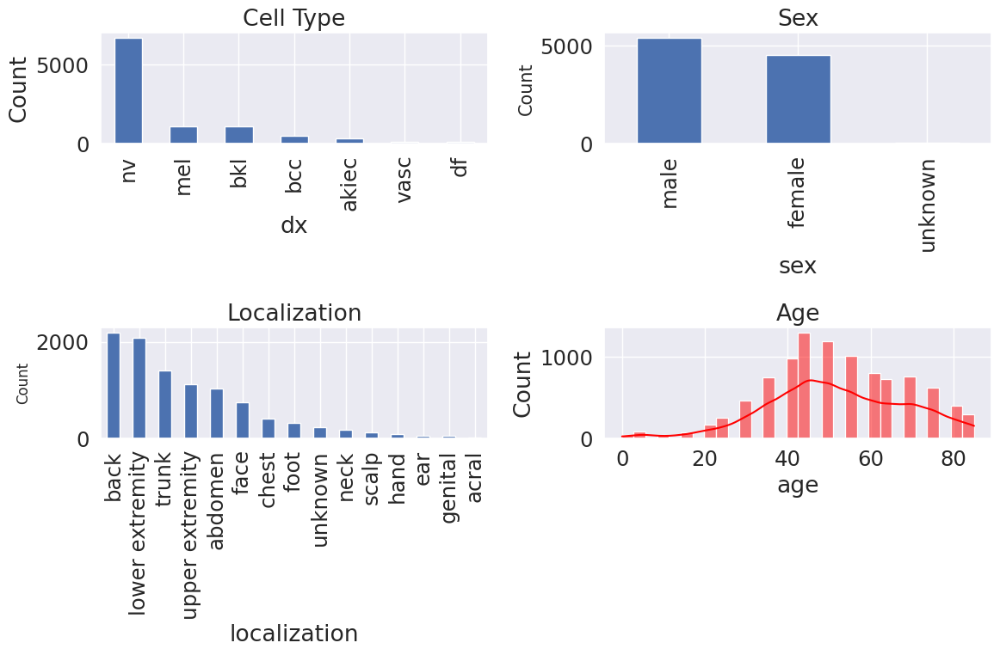

label
0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: count, dtype: int64
Image 0 shape: (64, 64, 3)
Image 1 shape: (64, 64, 3)
Image 2 shape: (64, 64, 3)
Image 3 shape: (64, 64, 3)
Image 4 shape: (64, 64, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_11 (Conv2D)                   │ (None, 62, 62, 256)         │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 29, 29, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 12, 12, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 2304)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 32)                  │          73,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 7)                   │             231 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 449,991 (1.72 MB)

 Trainable params: 449,991 (1.72 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/75
132/132 - 9s - 69ms/step - acc: 0.1897 - loss: 1.9180 - val_acc: 0.2263 - val_loss: 1.8484
Epoch 2/75
132/132 - 2s - 15ms/step - acc: 0.2861 - loss: 1.7584 - val_acc: 0.3783 - val_loss: 1.6704
Epoch 3/75
132/132 - 2s - 14ms/step - acc: 0.4133 - loss: 1.4994 - val_acc: 0.4320 - val_loss: 1.4943
Epoch 4/75
132/132 - 2s - 14ms/step - acc: 0.4465 - loss: 1.4160 - val_acc: 0.4434 - val_loss: 1.4544
Epoch 5/75
132/132 - 2s - 15ms/step - acc: 0.4731 - loss: 1.3606 - val_acc: 0.4400 - val_loss: 1.4089
Epoch 6/75
132/132 - 2s - 15ms/step - acc: 0.4994 - loss: 1.3075 - val_acc: 0.4949 - val_loss: 1.3504
Epoch 7/75
132/132 - 2s - 15ms/step - acc: 0.5170 - loss: 1.2695 - val_acc: 0.4697 - val_loss: 1.3508
Epoch 8/75
132/132 - 2s - 14ms/step - acc: 0.5078 - loss: 1.2667 - val_acc: 0.4960 - val_loss: 1.3511
Epoch 9/75
132/132 - 2s - 15ms/step - acc: 0.5200 - loss: 1.2372 - val_acc: 0.5246 - val_loss: 1.2960
Epoch 10/75
132/132 - 2s - 15ms/step - acc: 0.5474 - loss: 1.1785 - val_acc: 0.522

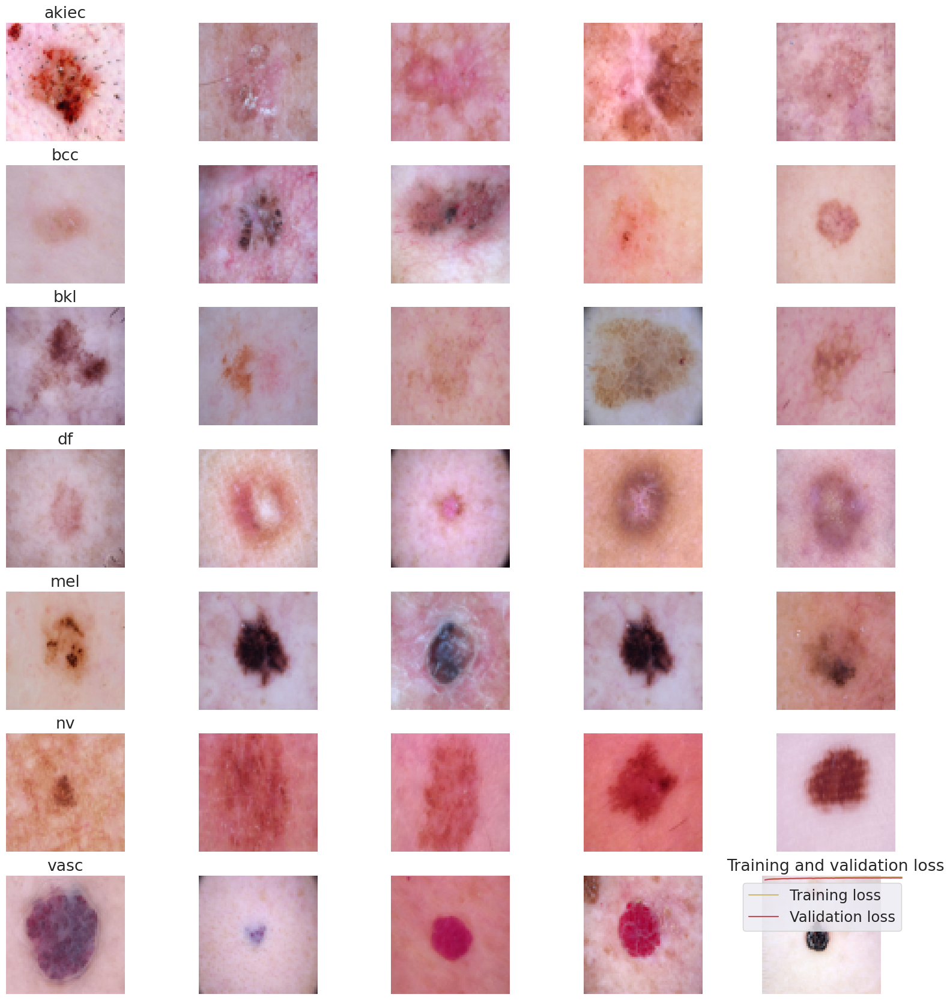

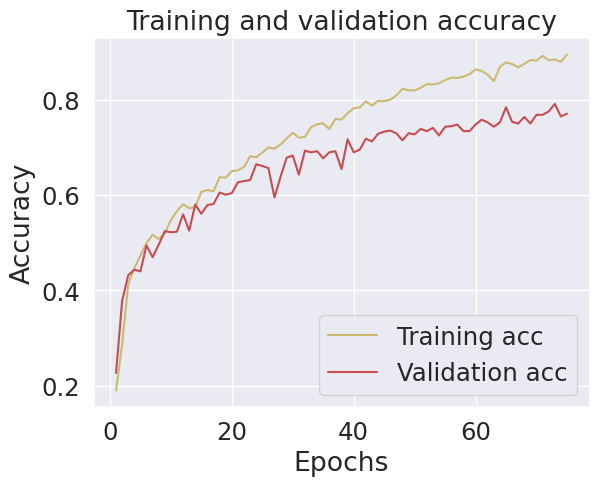

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


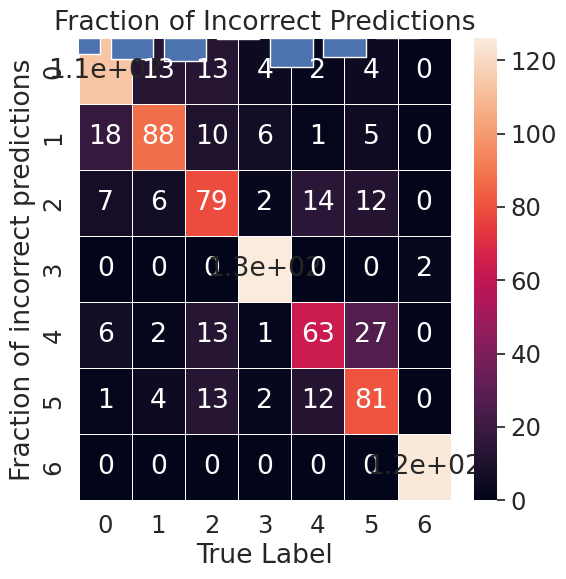

In [8]:
#size=64,batch size=20,epochs=75,optimizer='Adamax',Loss Function='Categorical Crossentropy'
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
from sklearn.utils import resample  # Added this import

np.random.seed(42)
from sklearn.metrics import confusion_matrix

import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

skin_df = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

SIZE = 64

# Label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
print(list(le.classes_))

skin_df['label'] = le.transform(skin_df["dx"])
print(skin_df.sample(10))

# Data distribution visualization
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type')

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex')

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count', size=12)
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.histplot(sample_age['age'], kde=True, color='red', bins=30)
ax4.set_title('Age')

plt.tight_layout()
plt.show()

# Balancing data
n_samples = 500
df_balanced = []
for label in range(7):
    df_label = skin_df[skin_df['label'] == label]
    df_balanced.append(resample(df_label, replace=True, n_samples=n_samples, random_state=42))

skin_df_balanced = pd.concat(df_balanced)
print(skin_df_balanced['label'].value_counts())

# Reading images based on image ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x
               for x in glob(os.path.join('/kaggle/input/skin-cancer-mnist-ham10000/', '*', '*.jpg'))}

skin_df_balanced['path'] = skin_df_balanced['image_id'].map(image_path.get)

# Check for missing paths
missing_paths = skin_df_balanced[skin_df_balanced['path'].isnull()]
if not missing_paths.empty:
    print("Missing image paths for the following image IDs:")
    print(missing_paths['image_id'])

# Use the path to read images, handling None values
def load_image(x):
    if x is not None and os.path.exists(x):
        try:
            img = Image.open(x).resize((SIZE, SIZE))
            return np.asarray(img)
        except Exception as e:
            print(f"Error loading image {x}: {e}")
            return np.zeros((SIZE, SIZE, 3))
    else:
        return np.zeros((SIZE, SIZE, 3))  # Return a zero array for missing images

skin_df_balanced['image'] = skin_df_balanced['path'].map(load_image)

# Rest of the code remains the same...
# (Training, model definition, etc.)
# Check if images are loaded correctly
for i, img in enumerate(skin_df_balanced['image'][:5]):
    if img.sum() == 0:
        print(f"Image {i} is black (all zeros)")
    else:
        print(f"Image {i} shape: {img.shape}")

# Plotting
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
for n_axs, (type_name, type_rows) in zip(m_axs, skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

# Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X / 255.  # Scale values to 0-1
Y = skin_df_balanced['label']
Y_cat = to_categorical(Y, num_classes=7)

# Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

# Define the model
model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Flatten())

model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

model.compile(loss='categorical_crossentropy', optimizer='Adamax', metrics=['acc'])

# Train the model
batch_size = 20
epochs = 75

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_test, y_test),
    verbose=2)

score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

# Plotting training and validation accuracy and loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(loss) + 1)
plt.plot(epochs_range, loss, 'y', label='Training loss')
plt.plot(epochs_range, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs_range, acc, 'y', label='Training acc')
plt.plot(epochs_range, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Prediction on test data
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

# Plot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')
plt.title('Fraction of Incorrect Predictions')
plt.show()

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
        lesion_id      image_id   dx    dx_type   age     sex  \
1617  HAM_0007180  ISIC_0033272  mel      histo  65.0    male   
8128  HAM_0007195  ISIC_0031923   nv      histo  40.0  female   
2168  HAM_0001835  ISIC_0026652  mel      histo  65.0    male   
1090  HAM_0000465  ISIC_0030583  bkl  consensus  35.0  female   
7754  HAM_0001720  ISIC_0034010   nv      histo  45.0    male   
8071  HAM_0006333  ISIC_0024424   nv      histo  35.0    male   
7423  HAM_0004548  ISIC_0032832   nv      histo  45.0  female   
8984  HAM_0006526  ISIC_0026671   nv      histo  55.0    male   
2310  HAM_0003102  ISIC_0032389  mel      histo  65.0    male   
7256  HAM_0004260  ISIC_0025525   nv      histo  65.0    male   

         localization  label  
1617             face      4  
8128  lower extremity      5  
2168             back      4  
1090            trunk      2  
7754          abdomen      5  
8071            trunk      5  
7423  upper extr

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


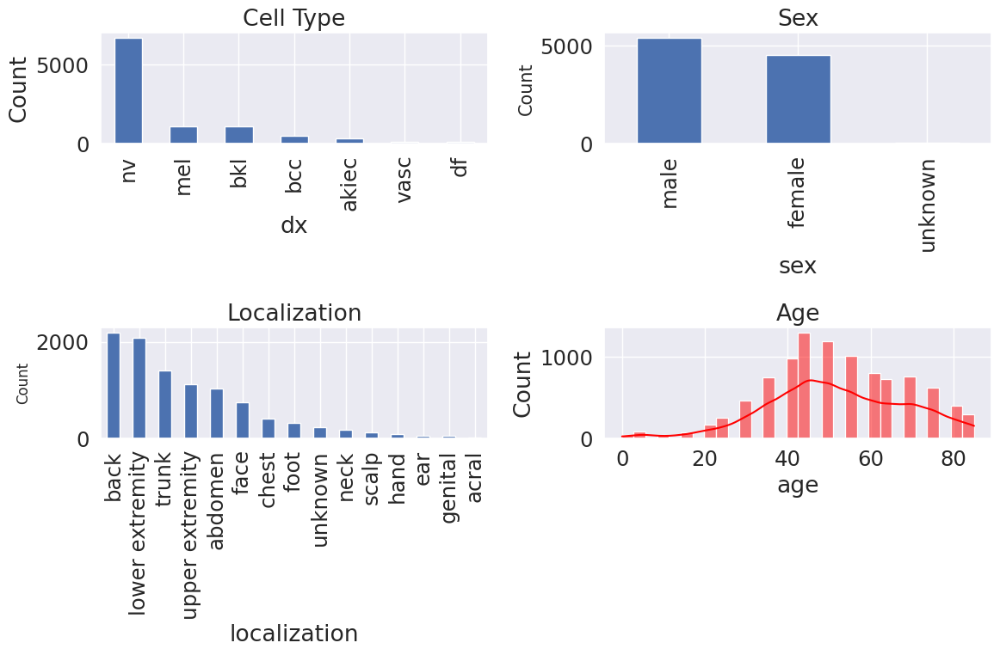

label
0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: count, dtype: int64
Image 0 shape: (64, 64, 3)
Image 1 shape: (64, 64, 3)
Image 2 shape: (64, 64, 3)
Image 3 shape: (64, 64, 3)
Image 4 shape: (64, 64, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_14 (Conv2D)                   │ (None, 62, 62, 256)         │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 29, 29, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 12, 12, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_15 (MaxPooling2D)      │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 2304)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 32)                  │          73,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 7)                   │             231 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 449,991 (1.72 MB)

 Trainable params: 449,991 (1.72 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/75
132/132 - 10s - 73ms/step - acc: 0.1958 - loss: 1.8957 - val_acc: 0.2400 - val_loss: 1.8000
Epoch 2/75
132/132 - 2s - 14ms/step - acc: 0.3112 - loss: 1.6793 - val_acc: 0.3520 - val_loss: 1.5402
Epoch 3/75
132/132 - 2s - 14ms/step - acc: 0.4095 - loss: 1.4527 - val_acc: 0.4194 - val_loss: 1.4020
Epoch 4/75
132/132 - 2s - 14ms/step - acc: 0.4560 - loss: 1.3629 - val_acc: 0.4709 - val_loss: 1.3184
Epoch 5/75
132/132 - 2s - 14ms/step - acc: 0.5002 - loss: 1.2901 - val_acc: 0.4834 - val_loss: 1.3147
Epoch 6/75
132/132 - 2s - 14ms/step - acc: 0.5192 - loss: 1.2478 - val_acc: 0.4994 - val_loss: 1.2794
Epoch 7/75
132/132 - 2s - 14ms/step - acc: 0.5326 - loss: 1.1968 - val_acc: 0.5246 - val_loss: 1.2780
Epoch 8/75
132/132 - 2s - 14ms/step - acc: 0.5768 - loss: 1.0995 - val_acc: 0.5497 - val_loss: 1.1417
Epoch 9/75
132/132 - 2s - 14ms/step - acc: 0.5920 - loss: 1.0607 - val_acc: 0.5737 - val_loss: 1.1482
Epoch 10/75
132/132 - 2s - 14ms/step - acc: 0.6217 - loss: 1.0105 - val_acc: 0.57

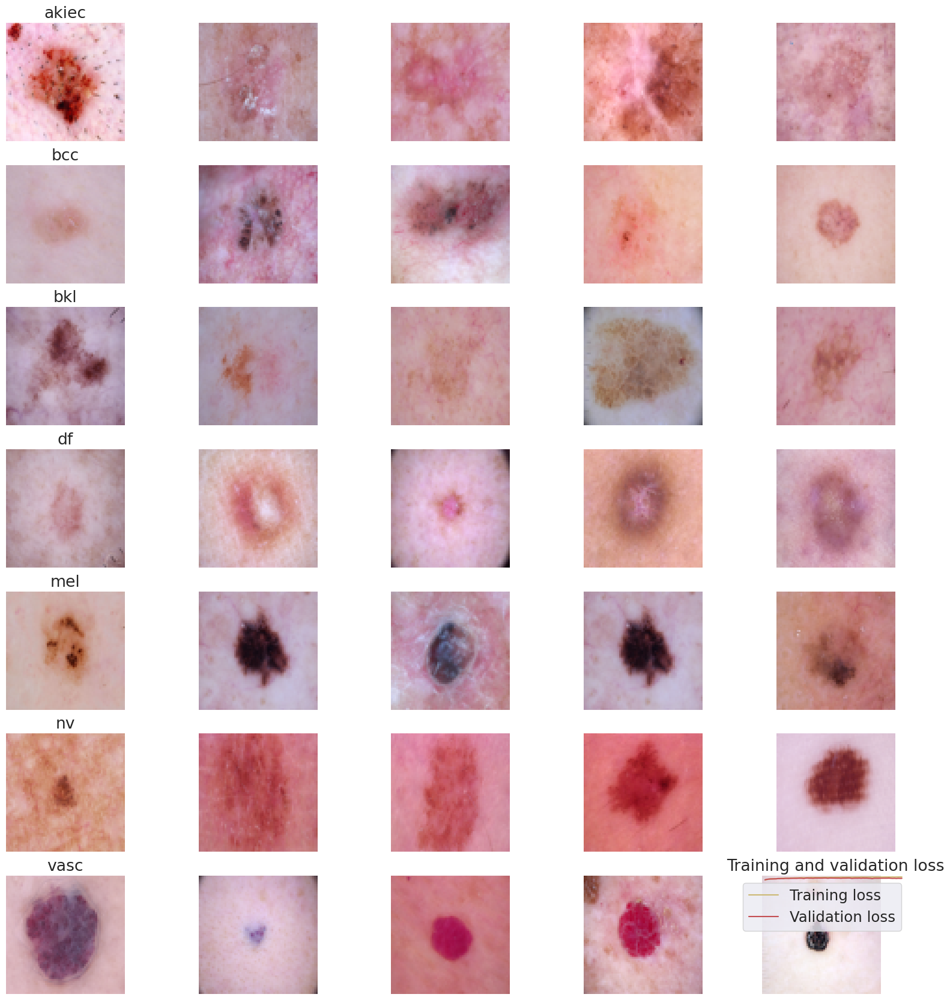

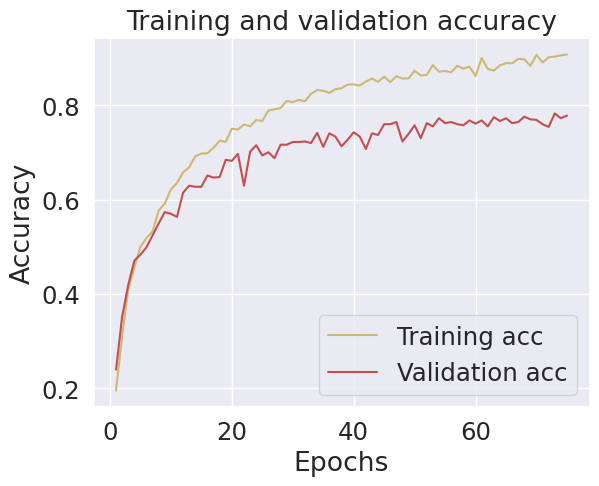

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


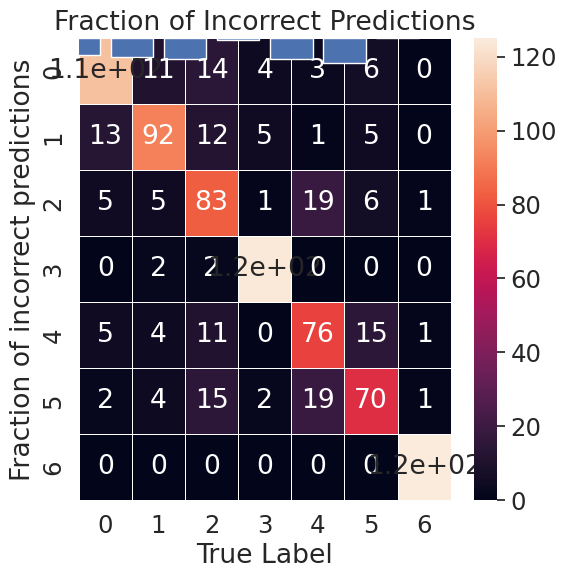

In [9]:
#size=64,batch size=20,epochs=75,optimizer='Nadam',Loss Function='Categorical Crossentropy'
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
from sklearn.utils import resample  # Added this import

np.random.seed(42)
from sklearn.metrics import confusion_matrix

import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

skin_df = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

SIZE = 64

# Label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
print(list(le.classes_))

skin_df['label'] = le.transform(skin_df["dx"])
print(skin_df.sample(10))

# Data distribution visualization
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type')

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex')

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count', size=12)
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.histplot(sample_age['age'], kde=True, color='red', bins=30)
ax4.set_title('Age')

plt.tight_layout()
plt.show()

# Balancing data
n_samples = 500
df_balanced = []
for label in range(7):
    df_label = skin_df[skin_df['label'] == label]
    df_balanced.append(resample(df_label, replace=True, n_samples=n_samples, random_state=42))

skin_df_balanced = pd.concat(df_balanced)
print(skin_df_balanced['label'].value_counts())

# Reading images based on image ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x
               for x in glob(os.path.join('/kaggle/input/skin-cancer-mnist-ham10000/', '*', '*.jpg'))}

skin_df_balanced['path'] = skin_df_balanced['image_id'].map(image_path.get)

# Check for missing paths
missing_paths = skin_df_balanced[skin_df_balanced['path'].isnull()]
if not missing_paths.empty:
    print("Missing image paths for the following image IDs:")
    print(missing_paths['image_id'])

# Use the path to read images, handling None values
def load_image(x):
    if x is not None and os.path.exists(x):
        try:
            img = Image.open(x).resize((SIZE, SIZE))
            return np.asarray(img)
        except Exception as e:
            print(f"Error loading image {x}: {e}")
            return np.zeros((SIZE, SIZE, 3))
    else:
        return np.zeros((SIZE, SIZE, 3))  # Return a zero array for missing images

skin_df_balanced['image'] = skin_df_balanced['path'].map(load_image)

# Rest of the code remains the same...
# (Training, model definition, etc.)
# Check if images are loaded correctly
for i, img in enumerate(skin_df_balanced['image'][:5]):
    if img.sum() == 0:
        print(f"Image {i} is black (all zeros)")
    else:
        print(f"Image {i} shape: {img.shape}")

# Plotting
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
for n_axs, (type_name, type_rows) in zip(m_axs, skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

# Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X / 255.  # Scale values to 0-1
Y = skin_df_balanced['label']
Y_cat = to_categorical(Y, num_classes=7)

# Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

# Define the model
model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Flatten())

model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

model.compile(loss='categorical_crossentropy', optimizer='Nadam', metrics=['acc'])

# Train the model
batch_size = 20
epochs = 75

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_test, y_test),
    verbose=2)

score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

# Plotting training and validation accuracy and loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(loss) + 1)
plt.plot(epochs_range, loss, 'y', label='Training loss')
plt.plot(epochs_range, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs_range, acc, 'y', label='Training acc')
plt.plot(epochs_range, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Prediction on test data
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

# Plot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')
plt.title('Fraction of Incorrect Predictions')
plt.show()

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
        lesion_id      image_id   dx    dx_type   age     sex  \
1617  HAM_0007180  ISIC_0033272  mel      histo  65.0    male   
8128  HAM_0007195  ISIC_0031923   nv      histo  40.0  female   
2168  HAM_0001835  ISIC_0026652  mel      histo  65.0    male   
1090  HAM_0000465  ISIC_0030583  bkl  consensus  35.0  female   
7754  HAM_0001720  ISIC_0034010   nv      histo  45.0    male   
8071  HAM_0006333  ISIC_0024424   nv      histo  35.0    male   
7423  HAM_0004548  ISIC_0032832   nv      histo  45.0  female   
8984  HAM_0006526  ISIC_0026671   nv      histo  55.0    male   
2310  HAM_0003102  ISIC_0032389  mel      histo  65.0    male   
7256  HAM_0004260  ISIC_0025525   nv      histo  65.0    male   

         localization  label  
1617             face      4  
8128  lower extremity      5  
2168             back      4  
1090            trunk      2  
7754          abdomen      5  
8071            trunk      5  
7423  upper extr

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


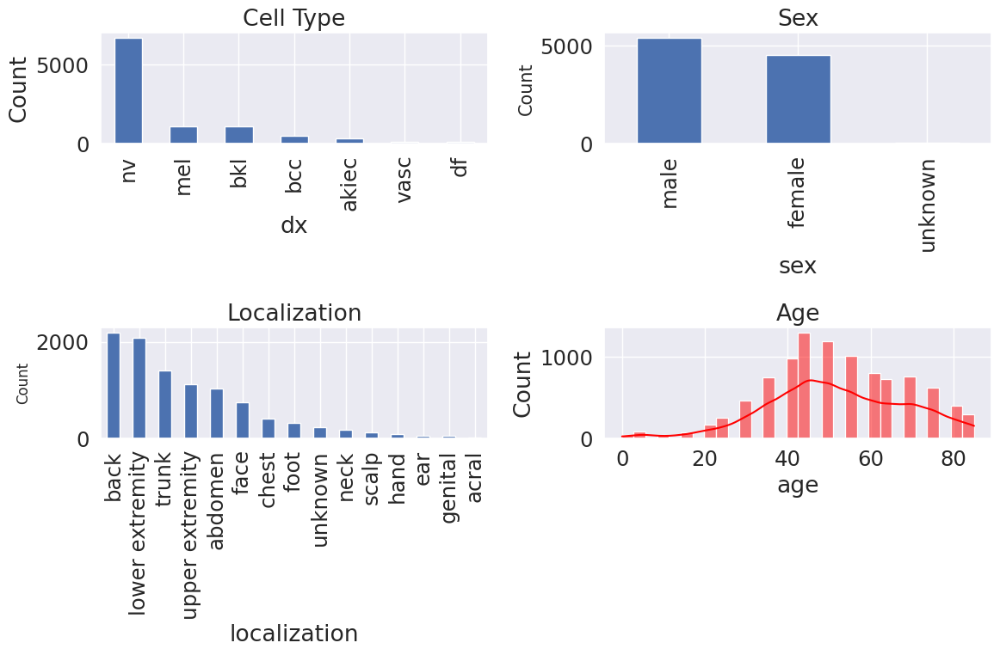

label
0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: count, dtype: int64
Image 0 shape: (64, 64, 3)
Image 1 shape: (64, 64, 3)
Image 2 shape: (64, 64, 3)
Image 3 shape: (64, 64, 3)
Image 4 shape: (64, 64, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_17 (Conv2D)                   │ (None, 62, 62, 256)         │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_16 (MaxPooling2D)      │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_18 (Conv2D)                   │ (None, 29, 29, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_17 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, 12, 12, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_19 (Dropout)                 │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 2304)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 32)                  │          73,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 7)                   │             231 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 449,991 (1.72 MB)

 Trainable params: 449,991 (1.72 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/75
132/132 - 8s - 64ms/step - acc: 0.1836 - loss: 1.9443 - val_acc: 0.1920 - val_loss: 1.8662
Epoch 2/75
132/132 - 2s - 14ms/step - acc: 0.2857 - loss: 1.7825 - val_acc: 0.2709 - val_loss: 1.8317
Epoch 3/75
132/132 - 2s - 14ms/step - acc: 0.3627 - loss: 1.5684 - val_acc: 0.3691 - val_loss: 1.5455
Epoch 4/75
132/132 - 2s - 14ms/step - acc: 0.4210 - loss: 1.4922 - val_acc: 0.3726 - val_loss: 1.5366
Epoch 5/75
132/132 - 2s - 14ms/step - acc: 0.4610 - loss: 1.4128 - val_acc: 0.3200 - val_loss: 2.4118
Epoch 6/75
132/132 - 2s - 14ms/step - acc: 0.4697 - loss: 1.3786 - val_acc: 0.4240 - val_loss: 1.4250
Epoch 7/75
132/132 - 2s - 14ms/step - acc: 0.5055 - loss: 1.2957 - val_acc: 0.3886 - val_loss: 1.5105
Epoch 8/75
132/132 - 2s - 14ms/step - acc: 0.5322 - loss: 1.2290 - val_acc: 0.4011 - val_loss: 1.6358
Epoch 9/75
132/132 - 2s - 15ms/step - acc: 0.5497 - loss: 1.1847 - val_acc: 0.4446 - val_loss: 1.3987
Epoch 10/75
132/132 - 2s - 15ms/step - acc: 0.5909 - loss: 1.1211 - val_acc: 0.389

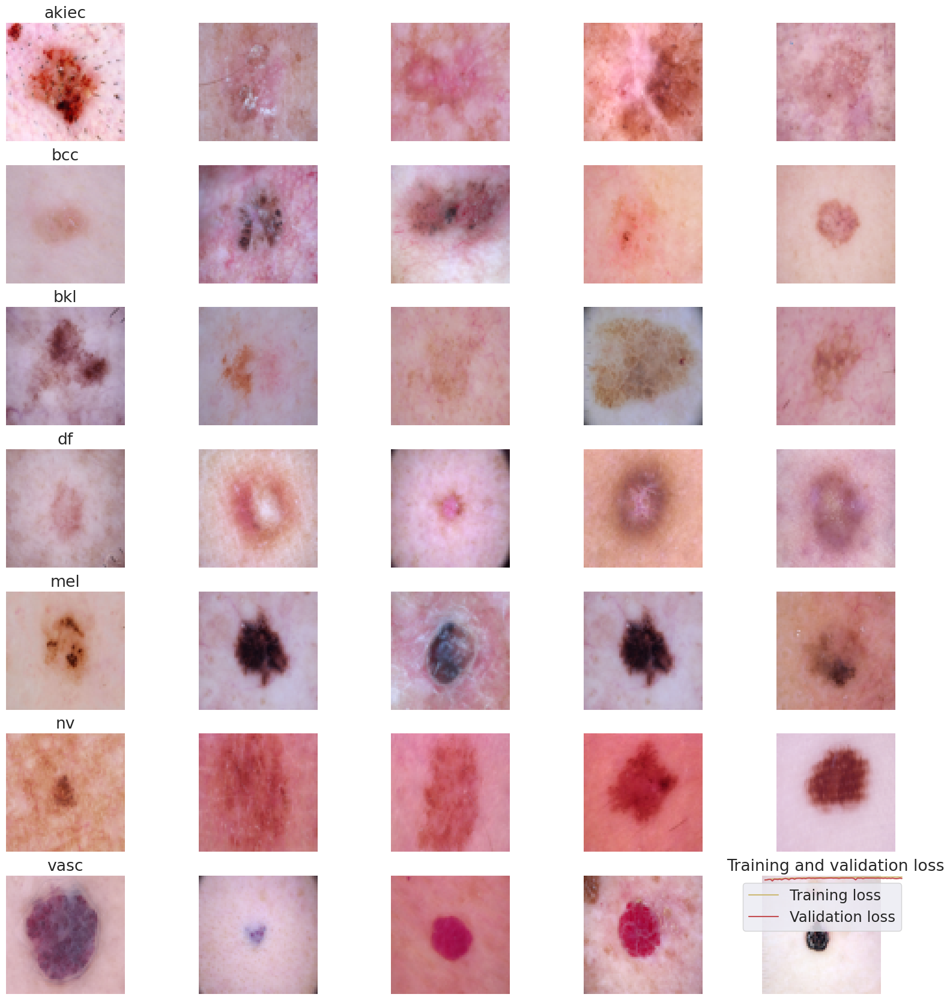

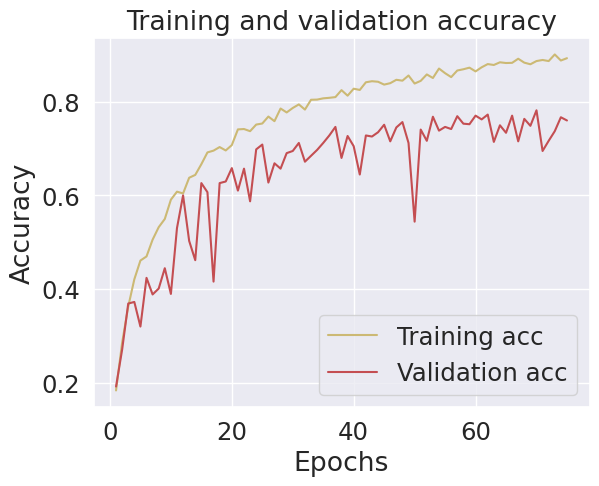

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


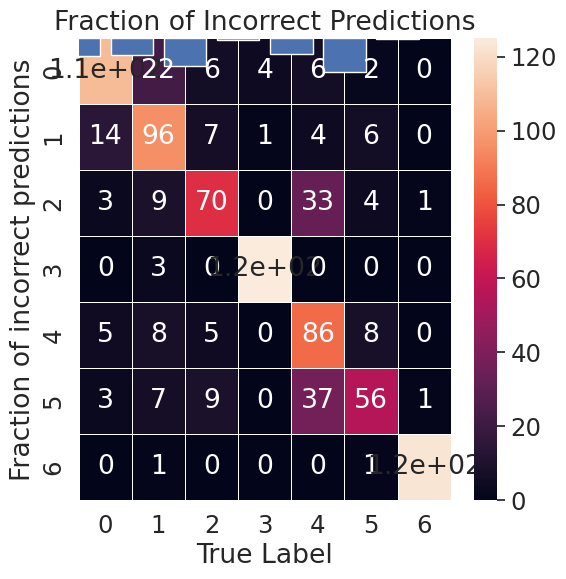

In [10]:
#size=64,batch size=20,epochs=75,optimizer='rmsprop',Loss Function='Categorical Crossentropy'
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
from sklearn.utils import resample  # Added this import

np.random.seed(42)
from sklearn.metrics import confusion_matrix

import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

skin_df = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

SIZE = 64

# Label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
print(list(le.classes_))

skin_df['label'] = le.transform(skin_df["dx"])
print(skin_df.sample(10))

# Data distribution visualization
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type')

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex')

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count', size=12)
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.histplot(sample_age['age'], kde=True, color='red', bins=30)
ax4.set_title('Age')

plt.tight_layout()
plt.show()

# Balancing data
n_samples = 500
df_balanced = []
for label in range(7):
    df_label = skin_df[skin_df['label'] == label]
    df_balanced.append(resample(df_label, replace=True, n_samples=n_samples, random_state=42))

skin_df_balanced = pd.concat(df_balanced)
print(skin_df_balanced['label'].value_counts())

# Reading images based on image ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x
               for x in glob(os.path.join('/kaggle/input/skin-cancer-mnist-ham10000/', '*', '*.jpg'))}

skin_df_balanced['path'] = skin_df_balanced['image_id'].map(image_path.get)

# Check for missing paths
missing_paths = skin_df_balanced[skin_df_balanced['path'].isnull()]
if not missing_paths.empty:
    print("Missing image paths for the following image IDs:")
    print(missing_paths['image_id'])

# Use the path to read images, handling None values
def load_image(x):
    if x is not None and os.path.exists(x):
        try:
            img = Image.open(x).resize((SIZE, SIZE))
            return np.asarray(img)
        except Exception as e:
            print(f"Error loading image {x}: {e}")
            return np.zeros((SIZE, SIZE, 3))
    else:
        return np.zeros((SIZE, SIZE, 3))  # Return a zero array for missing images

skin_df_balanced['image'] = skin_df_balanced['path'].map(load_image)

# Rest of the code remains the same...
# (Training, model definition, etc.)
# Check if images are loaded correctly
for i, img in enumerate(skin_df_balanced['image'][:5]):
    if img.sum() == 0:
        print(f"Image {i} is black (all zeros)")
    else:
        print(f"Image {i} shape: {img.shape}")

# Plotting
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
for n_axs, (type_name, type_rows) in zip(m_axs, skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

# Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X / 255.  # Scale values to 0-1
Y = skin_df_balanced['label']
Y_cat = to_categorical(Y, num_classes=7)

# Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

# Define the model
model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Flatten())

model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['acc'])

# Train the model
batch_size = 20
epochs = 75

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_test, y_test),
    verbose=2)

score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

# Plotting training and validation accuracy and loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(loss) + 1)
plt.plot(epochs_range, loss, 'y', label='Training loss')
plt.plot(epochs_range, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs_range, acc, 'y', label='Training acc')
plt.plot(epochs_range, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Prediction on test data
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

# Plot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')
plt.title('Fraction of Incorrect Predictions')
plt.show()

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
        lesion_id      image_id   dx    dx_type   age     sex  \
1617  HAM_0007180  ISIC_0033272  mel      histo  65.0    male   
8128  HAM_0007195  ISIC_0031923   nv      histo  40.0  female   
2168  HAM_0001835  ISIC_0026652  mel      histo  65.0    male   
1090  HAM_0000465  ISIC_0030583  bkl  consensus  35.0  female   
7754  HAM_0001720  ISIC_0034010   nv      histo  45.0    male   
8071  HAM_0006333  ISIC_0024424   nv      histo  35.0    male   
7423  HAM_0004548  ISIC_0032832   nv      histo  45.0  female   
8984  HAM_0006526  ISIC_0026671   nv      histo  55.0    male   
2310  HAM_0003102  ISIC_0032389  mel      histo  65.0    male   
7256  HAM_0004260  ISIC_0025525   nv      histo  65.0    male   

         localization  label  
1617             face      4  
8128  lower extremity      5  
2168             back      4  
1090            trunk      2  
7754          abdomen      5  
8071            trunk      5  
7423  upper extr

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


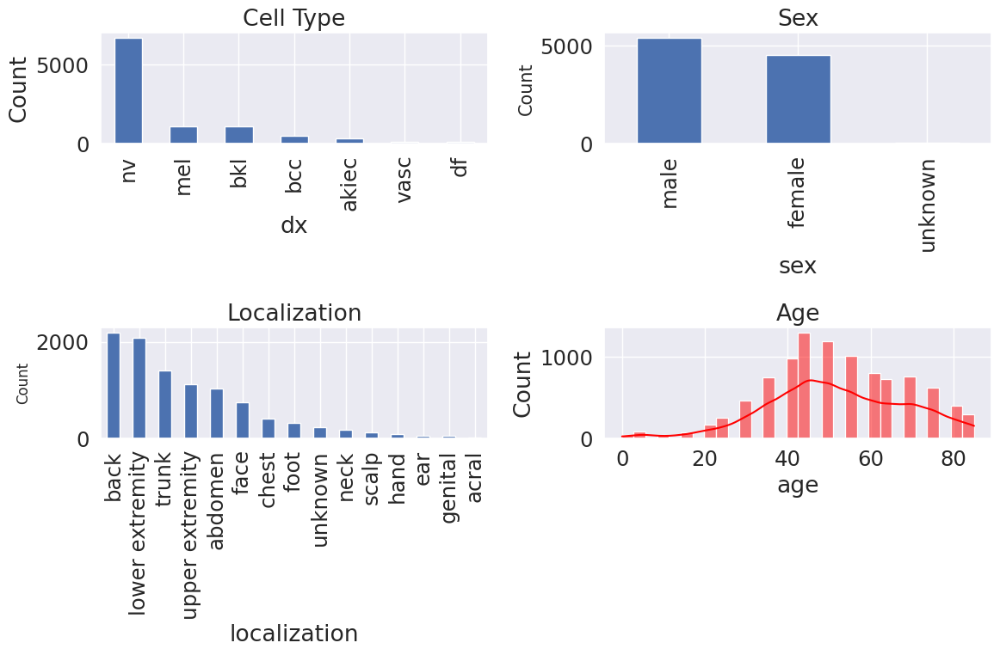

label
0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: count, dtype: int64
Image 0 shape: (64, 64, 3)
Image 1 shape: (64, 64, 3)
Image 2 shape: (64, 64, 3)
Image 3 shape: (64, 64, 3)
Image 4 shape: (64, 64, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)                   │ (None, 62, 62, 256)         │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_20 (Dropout)                 │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_21 (Conv2D)                   │ (None, 29, 29, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_20 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_21 (Dropout)                 │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_22 (Conv2D)                   │ (None, 12, 12, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_21 (MaxPooling2D)      │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_22 (Dropout)                 │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_7 (Flatten)                  │ (None, 2304)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 32)                  │          73,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 7)                   │             231 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 449,991 (1.72 MB)

 Trainable params: 449,991 (1.72 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/75
132/132 - 7s - 57ms/step - acc: 0.1535 - loss: 1.9547 - val_acc: 0.1863 - val_loss: 1.9427
Epoch 2/75
132/132 - 2s - 14ms/step - acc: 0.1794 - loss: 1.9350 - val_acc: 0.2320 - val_loss: 1.9328
Epoch 3/75
132/132 - 2s - 14ms/step - acc: 0.2358 - loss: 1.9062 - val_acc: 0.1291 - val_loss: 2.0105
Epoch 4/75
132/132 - 2s - 14ms/step - acc: 0.2491 - loss: 1.8636 - val_acc: 0.1371 - val_loss: 2.0060
Epoch 5/75
132/132 - 2s - 14ms/step - acc: 0.2625 - loss: 1.8162 - val_acc: 0.2446 - val_loss: 1.8296
Epoch 6/75
132/132 - 2s - 14ms/step - acc: 0.2834 - loss: 1.7724 - val_acc: 0.2754 - val_loss: 1.7856
Epoch 7/75
132/132 - 2s - 14ms/step - acc: 0.3029 - loss: 1.7273 - val_acc: 0.2594 - val_loss: 1.8482
Epoch 8/75
132/132 - 2s - 15ms/step - acc: 0.3463 - loss: 1.6884 - val_acc: 0.1794 - val_loss: 1.9995
Epoch 9/75
132/132 - 2s - 15ms/step - acc: 0.3371 - loss: 1.6470 - val_acc: 0.3737 - val_loss: 1.6614
Epoch 10/75
132/132 - 2s - 15ms/step - acc: 0.3592 - loss: 1.6168 - val_acc: 0.328

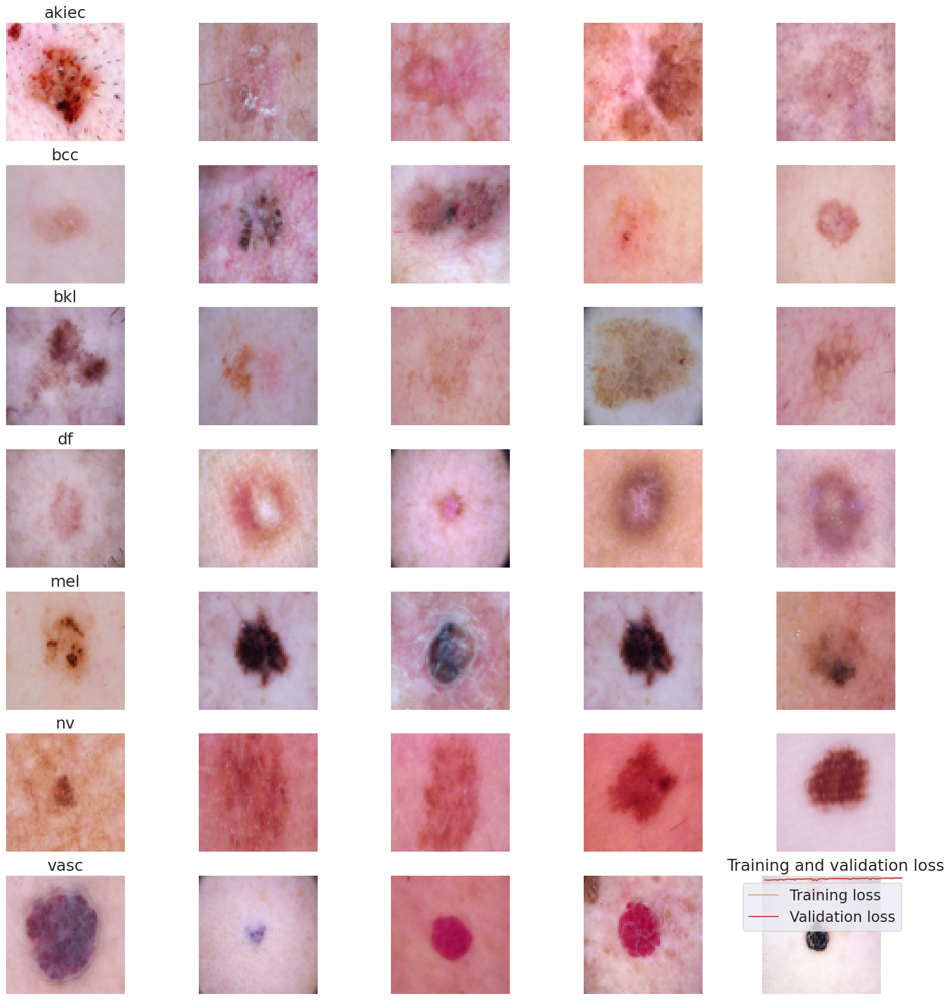

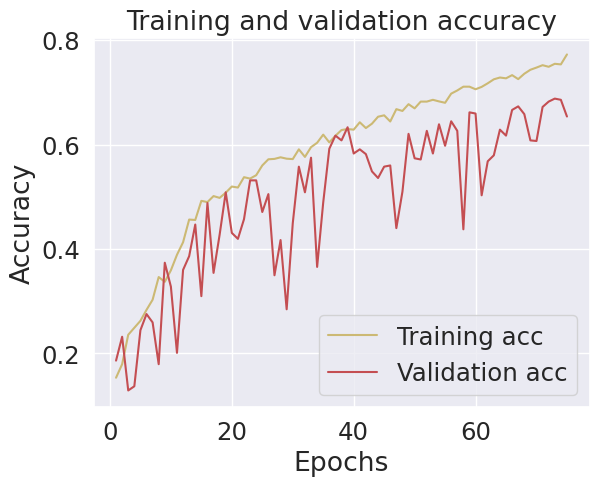

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


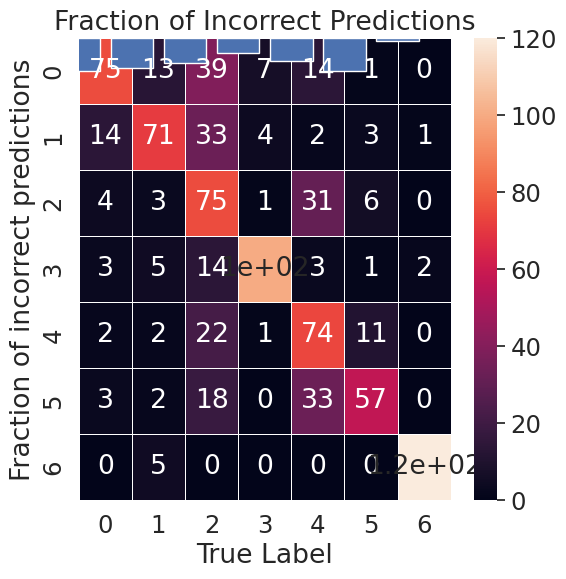

In [11]:
#size=64,batch size=20,epochs=75,optimizer='sgd',Loss Function='Categorical Crossentropy'
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
from sklearn.utils import resample  # Added this import

np.random.seed(42)
from sklearn.metrics import confusion_matrix

import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

skin_df = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

SIZE = 64

# Label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
print(list(le.classes_))

skin_df['label'] = le.transform(skin_df["dx"])
print(skin_df.sample(10))

# Data distribution visualization
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type')

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex')

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count', size=12)
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.histplot(sample_age['age'], kde=True, color='red', bins=30)
ax4.set_title('Age')

plt.tight_layout()
plt.show()

# Balancing data
n_samples = 500
df_balanced = []
for label in range(7):
    df_label = skin_df[skin_df['label'] == label]
    df_balanced.append(resample(df_label, replace=True, n_samples=n_samples, random_state=42))

skin_df_balanced = pd.concat(df_balanced)
print(skin_df_balanced['label'].value_counts())

# Reading images based on image ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x
               for x in glob(os.path.join('/kaggle/input/skin-cancer-mnist-ham10000/', '*', '*.jpg'))}

skin_df_balanced['path'] = skin_df_balanced['image_id'].map(image_path.get)

# Check for missing paths
missing_paths = skin_df_balanced[skin_df_balanced['path'].isnull()]
if not missing_paths.empty:
    print("Missing image paths for the following image IDs:")
    print(missing_paths['image_id'])

# Use the path to read images, handling None values
def load_image(x):
    if x is not None and os.path.exists(x):
        try:
            img = Image.open(x).resize((SIZE, SIZE))
            return np.asarray(img)
        except Exception as e:
            print(f"Error loading image {x}: {e}")
            return np.zeros((SIZE, SIZE, 3))
    else:
        return np.zeros((SIZE, SIZE, 3))  # Return a zero array for missing images

skin_df_balanced['image'] = skin_df_balanced['path'].map(load_image)

# Rest of the code remains the same...
# (Training, model definition, etc.)
# Check if images are loaded correctly
for i, img in enumerate(skin_df_balanced['image'][:5]):
    if img.sum() == 0:
        print(f"Image {i} is black (all zeros)")
    else:
        print(f"Image {i} shape: {img.shape}")

# Plotting
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
for n_axs, (type_name, type_rows) in zip(m_axs, skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

# Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X / 255.  # Scale values to 0-1
Y = skin_df_balanced['label']
Y_cat = to_categorical(Y, num_classes=7)

# Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

# Define the model
model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Flatten())

model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['acc'])

# Train the model
batch_size = 20
epochs = 75

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_test, y_test),
    verbose=2)

score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

# Plotting training and validation accuracy and loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(loss) + 1)
plt.plot(epochs_range, loss, 'y', label='Training loss')
plt.plot(epochs_range, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs_range, acc, 'y', label='Training acc')
plt.plot(epochs_range, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Prediction on test data
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

# Plot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')
plt.title('Fraction of Incorrect Predictions')
plt.show()

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
        lesion_id      image_id   dx    dx_type   age     sex  \
1617  HAM_0007180  ISIC_0033272  mel      histo  65.0    male   
8128  HAM_0007195  ISIC_0031923   nv      histo  40.0  female   
2168  HAM_0001835  ISIC_0026652  mel      histo  65.0    male   
1090  HAM_0000465  ISIC_0030583  bkl  consensus  35.0  female   
7754  HAM_0001720  ISIC_0034010   nv      histo  45.0    male   
8071  HAM_0006333  ISIC_0024424   nv      histo  35.0    male   
7423  HAM_0004548  ISIC_0032832   nv      histo  45.0  female   
8984  HAM_0006526  ISIC_0026671   nv      histo  55.0    male   
2310  HAM_0003102  ISIC_0032389  mel      histo  65.0    male   
7256  HAM_0004260  ISIC_0025525   nv      histo  65.0    male   

         localization  label  
1617             face      4  
8128  lower extremity      5  
2168             back      4  
1090            trunk      2  
7754          abdomen      5  
8071            trunk      5  
7423  upper extr

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


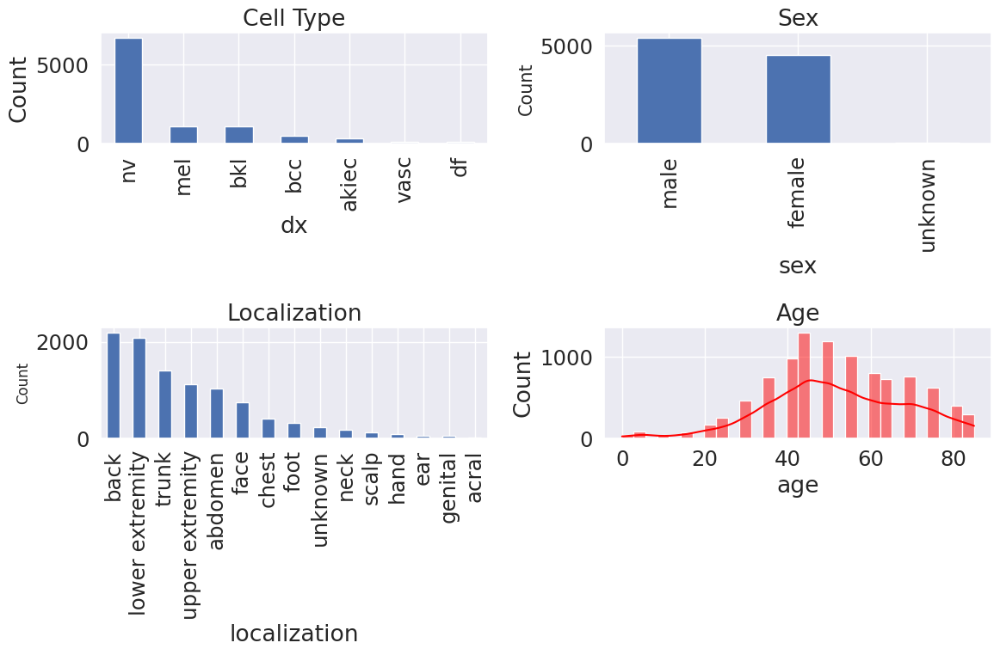

label
0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: count, dtype: int64
Image 0 shape: (64, 64, 3)
Image 1 shape: (64, 64, 3)
Image 2 shape: (64, 64, 3)
Image 3 shape: (64, 64, 3)
Image 4 shape: (64, 64, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_23 (Conv2D)                   │ (None, 62, 62, 256)         │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_22 (MaxPooling2D)      │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_23 (Dropout)                 │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_24 (Conv2D)                   │ (None, 29, 29, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_23 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_24 (Dropout)                 │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_25 (Conv2D)                   │ (None, 12, 12, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_24 (MaxPooling2D)      │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_25 (Dropout)                 │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_8 (Flatten)                  │ (None, 2304)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 32)                  │          73,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 7)                   │             231 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 449,991 (1.72 MB)

 Trainable params: 449,991 (1.72 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/75
132/132 - 8s - 62ms/step - acc: 0.1829 - loss: 1.9383 - val_acc: 0.2114 - val_loss: 1.8797
Epoch 2/75
132/132 - 2s - 14ms/step - acc: 0.3116 - loss: 1.6934 - val_acc: 0.4069 - val_loss: 1.5521
Epoch 3/75
132/132 - 2s - 14ms/step - acc: 0.3924 - loss: 1.5456 - val_acc: 0.2926 - val_loss: 1.6554
Epoch 4/75
132/132 - 2s - 14ms/step - acc: 0.4278 - loss: 1.4674 - val_acc: 0.4034 - val_loss: 1.6494
Epoch 5/75
132/132 - 2s - 14ms/step - acc: 0.4541 - loss: 1.4225 - val_acc: 0.4229 - val_loss: 1.4134
Epoch 6/75
132/132 - 2s - 14ms/step - acc: 0.4964 - loss: 1.3223 - val_acc: 0.3806 - val_loss: 1.5432
Epoch 7/75
132/132 - 2s - 14ms/step - acc: 0.5181 - loss: 1.2633 - val_acc: 0.5109 - val_loss: 1.2544
Epoch 8/75
132/132 - 2s - 14ms/step - acc: 0.5379 - loss: 1.2306 - val_acc: 0.4903 - val_loss: 1.3531
Epoch 9/75
132/132 - 2s - 15ms/step - acc: 0.5623 - loss: 1.1794 - val_acc: 0.3920 - val_loss: 1.6230
Epoch 10/75
132/132 - 2s - 14ms/step - acc: 0.5661 - loss: 1.1246 - val_acc: 0.538

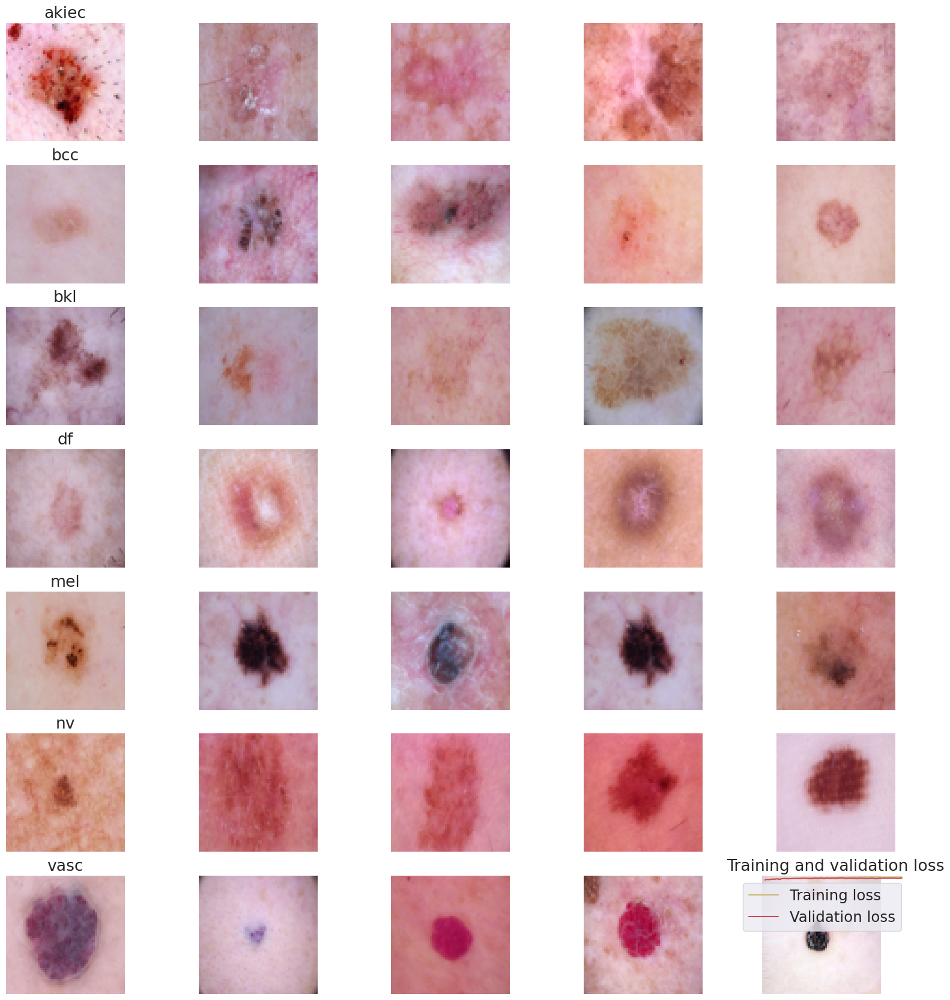

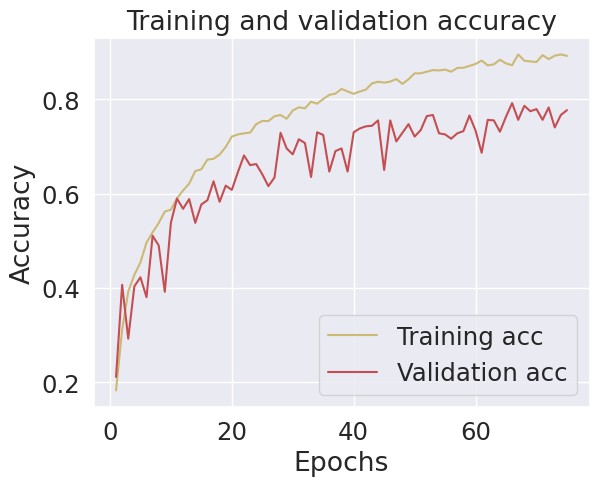

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


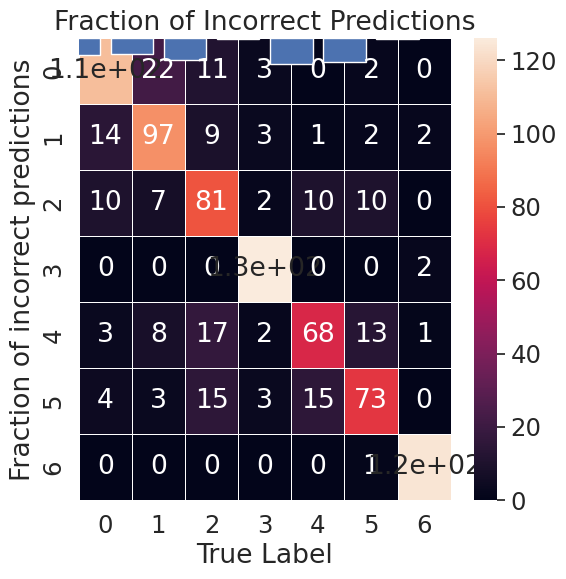

In [12]:
#size=64,batch size=20,epochs=75,optimizer='rmsprop',Loss Function='kl_divergence'
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
from sklearn.utils import resample  # Added this import

np.random.seed(42)
from sklearn.metrics import confusion_matrix

import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

skin_df = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

SIZE = 64

# Label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
print(list(le.classes_))

skin_df['label'] = le.transform(skin_df["dx"])
print(skin_df.sample(10))

# Data distribution visualization
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type')

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex')

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count', size=12)
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.histplot(sample_age['age'], kde=True, color='red', bins=30)
ax4.set_title('Age')

plt.tight_layout()
plt.show()

# Balancing data
n_samples = 500
df_balanced = []
for label in range(7):
    df_label = skin_df[skin_df['label'] == label]
    df_balanced.append(resample(df_label, replace=True, n_samples=n_samples, random_state=42))

skin_df_balanced = pd.concat(df_balanced)
print(skin_df_balanced['label'].value_counts())

# Reading images based on image ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x
               for x in glob(os.path.join('/kaggle/input/skin-cancer-mnist-ham10000/', '*', '*.jpg'))}

skin_df_balanced['path'] = skin_df_balanced['image_id'].map(image_path.get)

# Check for missing paths
missing_paths = skin_df_balanced[skin_df_balanced['path'].isnull()]
if not missing_paths.empty:
    print("Missing image paths for the following image IDs:")
    print(missing_paths['image_id'])

# Use the path to read images, handling None values
def load_image(x):
    if x is not None and os.path.exists(x):
        try:
            img = Image.open(x).resize((SIZE, SIZE))
            return np.asarray(img)
        except Exception as e:
            print(f"Error loading image {x}: {e}")
            return np.zeros((SIZE, SIZE, 3))
    else:
        return np.zeros((SIZE, SIZE, 3))  # Return a zero array for missing images

skin_df_balanced['image'] = skin_df_balanced['path'].map(load_image)

# Rest of the code remains the same...
# (Training, model definition, etc.)
# Check if images are loaded correctly
for i, img in enumerate(skin_df_balanced['image'][:5]):
    if img.sum() == 0:
        print(f"Image {i} is black (all zeros)")
    else:
        print(f"Image {i} shape: {img.shape}")

# Plotting
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
for n_axs, (type_name, type_rows) in zip(m_axs, skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

# Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X / 255.  # Scale values to 0-1
Y = skin_df_balanced['label']
Y_cat = to_categorical(Y, num_classes=7)

# Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

# Define the model
model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Flatten())

model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

model.compile(loss='kl_divergence', optimizer='rmsprop', metrics=['acc'])

# Train the model
batch_size = 20
epochs = 75

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_test, y_test),
    verbose=2)

score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

# Plotting training and validation accuracy and loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(loss) + 1)
plt.plot(epochs_range, loss, 'y', label='Training loss')
plt.plot(epochs_range, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs_range, acc, 'y', label='Training acc')
plt.plot(epochs_range, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Prediction on test data
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

# Plot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')
plt.title('Fraction of Incorrect Predictions')
plt.show()

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
        lesion_id      image_id   dx    dx_type   age     sex  \
1617  HAM_0007180  ISIC_0033272  mel      histo  65.0    male   
8128  HAM_0007195  ISIC_0031923   nv      histo  40.0  female   
2168  HAM_0001835  ISIC_0026652  mel      histo  65.0    male   
1090  HAM_0000465  ISIC_0030583  bkl  consensus  35.0  female   
7754  HAM_0001720  ISIC_0034010   nv      histo  45.0    male   
8071  HAM_0006333  ISIC_0024424   nv      histo  35.0    male   
7423  HAM_0004548  ISIC_0032832   nv      histo  45.0  female   
8984  HAM_0006526  ISIC_0026671   nv      histo  55.0    male   
2310  HAM_0003102  ISIC_0032389  mel      histo  65.0    male   
7256  HAM_0004260  ISIC_0025525   nv      histo  65.0    male   

         localization  label  
1617             face      4  
8128  lower extremity      5  
2168             back      4  
1090            trunk      2  
7754          abdomen      5  
8071            trunk      5  
7423  upper extr

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


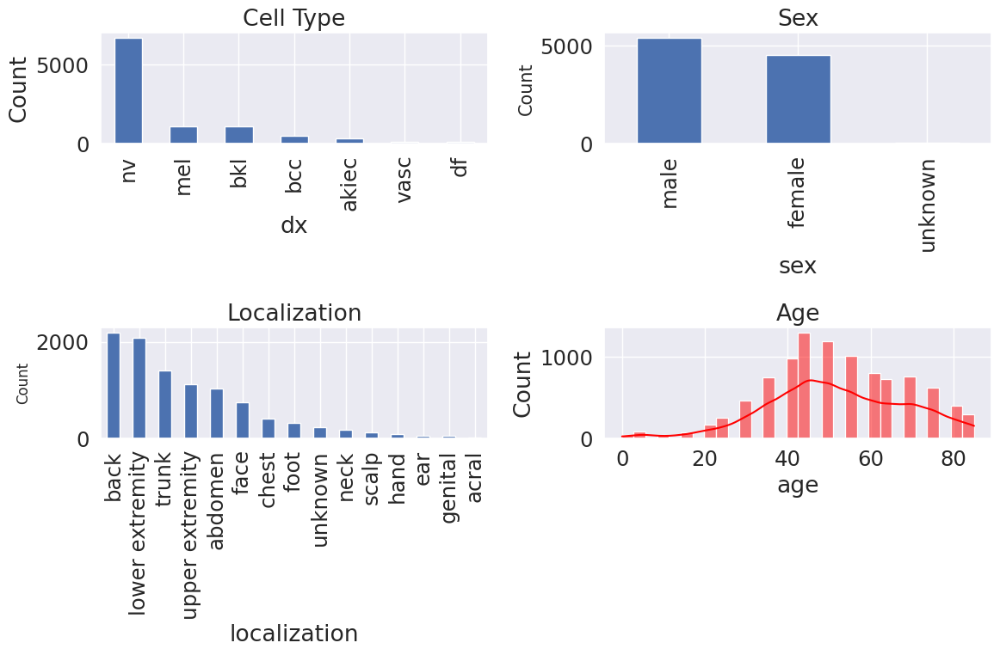

label
0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: count, dtype: int64
Image 0 shape: (64, 64, 3)
Image 1 shape: (64, 64, 3)
Image 2 shape: (64, 64, 3)
Image 3 shape: (64, 64, 3)
Image 4 shape: (64, 64, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_26 (Conv2D)                   │ (None, 62, 62, 256)         │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_25 (MaxPooling2D)      │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_26 (Dropout)                 │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_27 (Conv2D)                   │ (None, 29, 29, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_26 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_27 (Dropout)                 │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_28 (Conv2D)                   │ (None, 12, 12, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_27 (MaxPooling2D)      │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_28 (Dropout)                 │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_9 (Flatten)                  │ (None, 2304)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 32)                  │          73,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 7)                   │             231 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 449,991 (1.72 MB)

 Trainable params: 449,991 (1.72 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/75
132/132 - 8s - 61ms/step - acc: 0.1931 - loss: 0.4179 - val_acc: 0.2469 - val_loss: 0.4066
Epoch 2/75
132/132 - 2s - 14ms/step - acc: 0.2823 - loss: 0.3965 - val_acc: 0.1600 - val_loss: 0.4831
Epoch 3/75
132/132 - 2s - 14ms/step - acc: 0.3688 - loss: 0.3716 - val_acc: 0.2457 - val_loss: 0.4970
Epoch 4/75
132/132 - 2s - 14ms/step - acc: 0.3977 - loss: 0.3593 - val_acc: 0.3200 - val_loss: 0.3762
Epoch 5/75
132/132 - 2s - 14ms/step - acc: 0.4263 - loss: 0.3503 - val_acc: 0.3383 - val_loss: 0.3646
Epoch 6/75
132/132 - 2s - 14ms/step - acc: 0.4598 - loss: 0.3425 - val_acc: 0.3749 - val_loss: 0.3578
Epoch 7/75
132/132 - 2s - 14ms/step - acc: 0.4846 - loss: 0.3334 - val_acc: 0.4720 - val_loss: 0.3408
Epoch 8/75
132/132 - 2s - 14ms/step - acc: 0.5139 - loss: 0.3265 - val_acc: 0.5440 - val_loss: 0.3202
Epoch 9/75
132/132 - 2s - 14ms/step - acc: 0.5345 - loss: 0.3201 - val_acc: 0.5349 - val_loss: 0.3346
Epoch 10/75
132/132 - 2s - 14ms/step - acc: 0.5592 - loss: 0.3115 - val_acc: 0.454

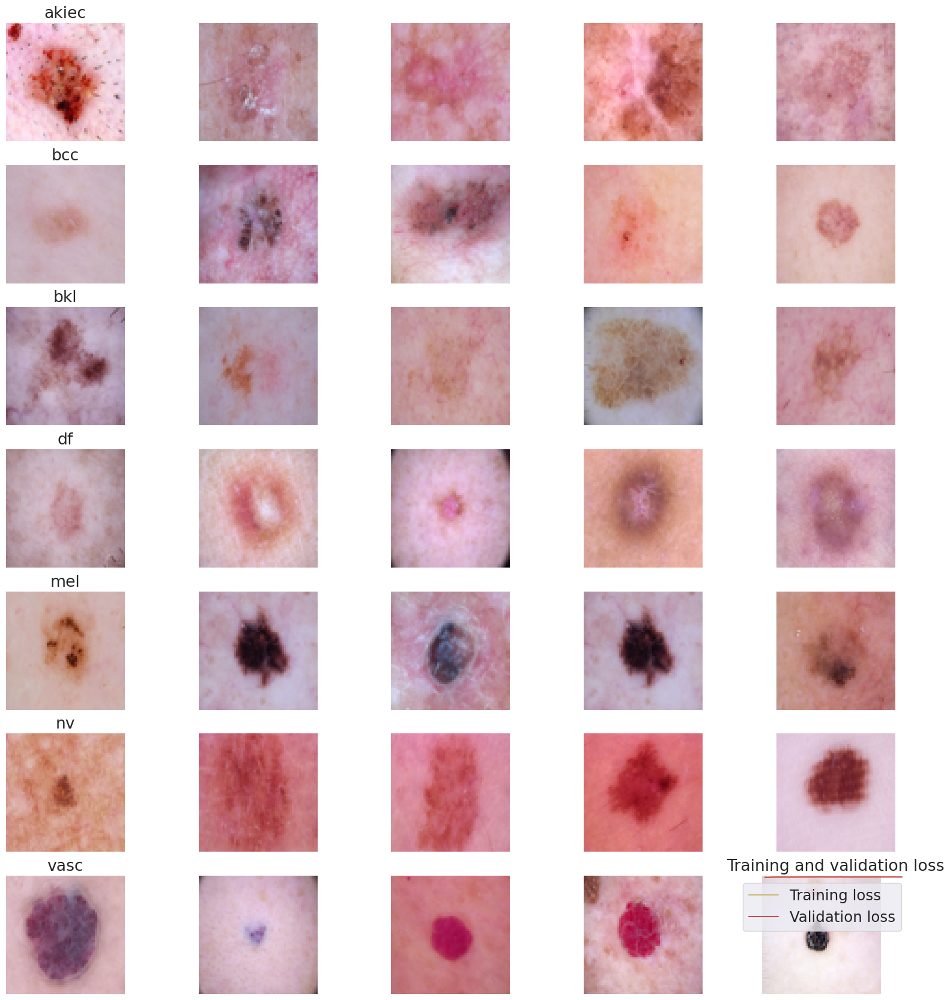

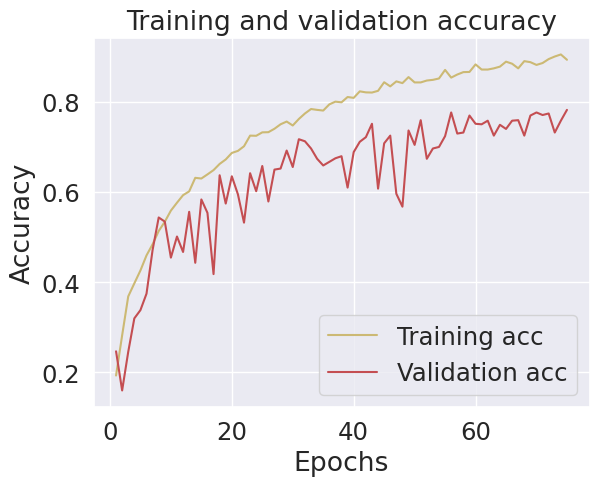

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


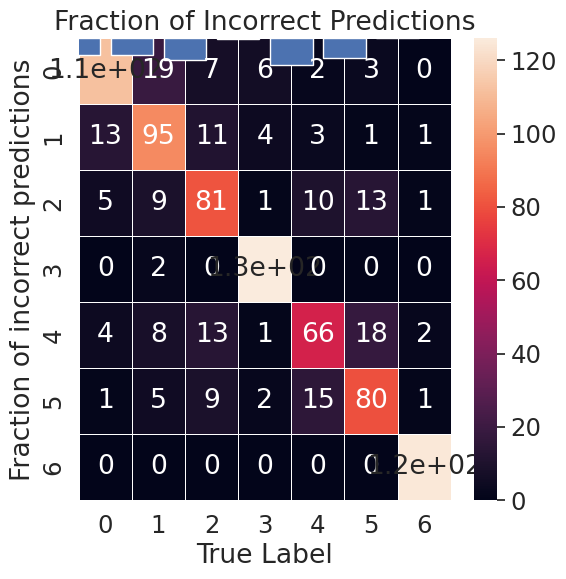

In [13]:
#size=64,batch size=20,epochs=75,optimizer='rmsprop',Loss Function='poisson'
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
from sklearn.utils import resample  # Added this import

np.random.seed(42)
from sklearn.metrics import confusion_matrix

import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

skin_df = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

SIZE = 64

# Label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
print(list(le.classes_))

skin_df['label'] = le.transform(skin_df["dx"])
print(skin_df.sample(10))

# Data distribution visualization
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type')

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex')

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count', size=12)
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.histplot(sample_age['age'], kde=True, color='red', bins=30)
ax4.set_title('Age')

plt.tight_layout()
plt.show()

# Balancing data
n_samples = 500
df_balanced = []
for label in range(7):
    df_label = skin_df[skin_df['label'] == label]
    df_balanced.append(resample(df_label, replace=True, n_samples=n_samples, random_state=42))

skin_df_balanced = pd.concat(df_balanced)
print(skin_df_balanced['label'].value_counts())

# Reading images based on image ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x
               for x in glob(os.path.join('/kaggle/input/skin-cancer-mnist-ham10000/', '*', '*.jpg'))}

skin_df_balanced['path'] = skin_df_balanced['image_id'].map(image_path.get)

# Check for missing paths
missing_paths = skin_df_balanced[skin_df_balanced['path'].isnull()]
if not missing_paths.empty:
    print("Missing image paths for the following image IDs:")
    print(missing_paths['image_id'])

# Use the path to read images, handling None values
def load_image(x):
    if x is not None and os.path.exists(x):
        try:
            img = Image.open(x).resize((SIZE, SIZE))
            return np.asarray(img)
        except Exception as e:
            print(f"Error loading image {x}: {e}")
            return np.zeros((SIZE, SIZE, 3))
    else:
        return np.zeros((SIZE, SIZE, 3))  # Return a zero array for missing images

skin_df_balanced['image'] = skin_df_balanced['path'].map(load_image)

# Rest of the code remains the same...
# (Training, model definition, etc.)
# Check if images are loaded correctly
for i, img in enumerate(skin_df_balanced['image'][:5]):
    if img.sum() == 0:
        print(f"Image {i} is black (all zeros)")
    else:
        print(f"Image {i} shape: {img.shape}")

# Plotting
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
for n_axs, (type_name, type_rows) in zip(m_axs, skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

# Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X / 255.  # Scale values to 0-1
Y = skin_df_balanced['label']
Y_cat = to_categorical(Y, num_classes=7)

# Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

# Define the model
model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Flatten())

model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

model.compile(loss='poisson', optimizer='rmsprop', metrics=['acc'])

# Train the model
batch_size = 20
epochs = 75

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_test, y_test),
    verbose=2)

score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

# Plotting training and validation accuracy and loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(loss) + 1)
plt.plot(epochs_range, loss, 'y', label='Training loss')
plt.plot(epochs_range, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs_range, acc, 'y', label='Training acc')
plt.plot(epochs_range, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Prediction on test data
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

# Plot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')
plt.title('Fraction of Incorrect Predictions')
plt.show()

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
        lesion_id      image_id   dx    dx_type   age     sex  \
1617  HAM_0007180  ISIC_0033272  mel      histo  65.0    male   
8128  HAM_0007195  ISIC_0031923   nv      histo  40.0  female   
2168  HAM_0001835  ISIC_0026652  mel      histo  65.0    male   
1090  HAM_0000465  ISIC_0030583  bkl  consensus  35.0  female   
7754  HAM_0001720  ISIC_0034010   nv      histo  45.0    male   
8071  HAM_0006333  ISIC_0024424   nv      histo  35.0    male   
7423  HAM_0004548  ISIC_0032832   nv      histo  45.0  female   
8984  HAM_0006526  ISIC_0026671   nv      histo  55.0    male   
2310  HAM_0003102  ISIC_0032389  mel      histo  65.0    male   
7256  HAM_0004260  ISIC_0025525   nv      histo  65.0    male   

         localization  label  
1617             face      4  
8128  lower extremity      5  
2168             back      4  
1090            trunk      2  
7754          abdomen      5  
8071            trunk      5  
7423  upper extr

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


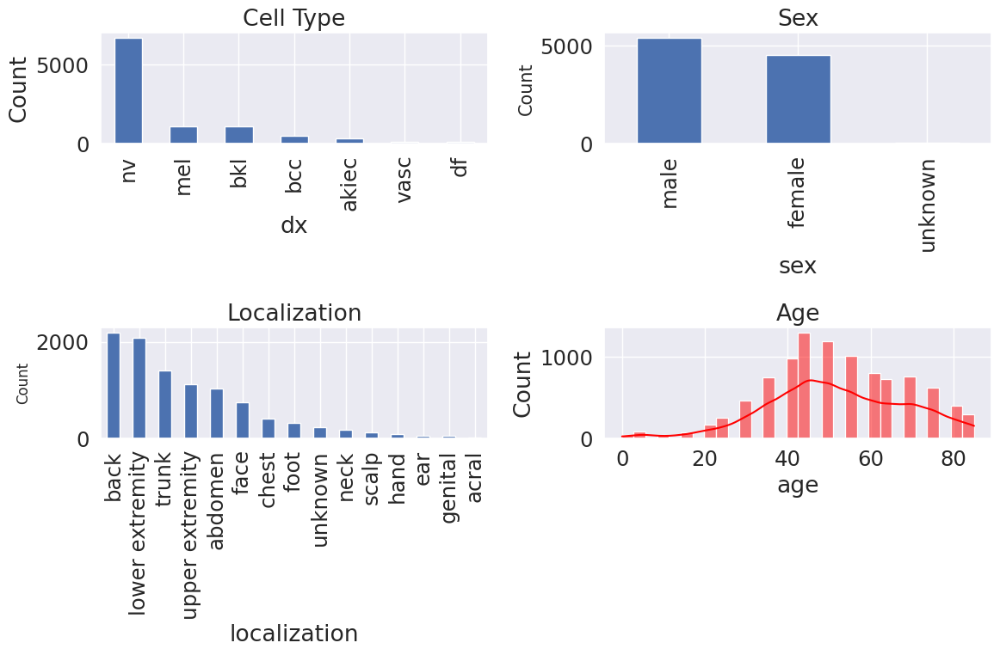

label
0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: count, dtype: int64
Image 0 shape: (64, 64, 3)
Image 1 shape: (64, 64, 3)
Image 2 shape: (64, 64, 3)
Image 3 shape: (64, 64, 3)
Image 4 shape: (64, 64, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_29 (Conv2D)                   │ (None, 62, 62, 256)         │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_28 (MaxPooling2D)      │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_29 (Dropout)                 │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_30 (Conv2D)                   │ (None, 29, 29, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_29 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_30 (Dropout)                 │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_31 (Conv2D)                   │ (None, 12, 12, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_30 (MaxPooling2D)      │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_31 (Dropout)                 │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_10 (Flatten)                 │ (None, 2304)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 32)                  │          73,760 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 7)                   │             231 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 449,991 (1.72 MB)

 Trainable params: 449,991 (1.72 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/75
132/132 - 10s - 76ms/step - acc: 0.1863 - loss: -3.8185e-01 - val_acc: 0.2034 - val_loss: -3.8437e-01
Epoch 2/75
132/132 - 2s - 14ms/step - acc: 0.3208 - loss: -4.6134e-01 - val_acc: 0.1760 - val_loss: -2.2352e-01
Epoch 3/75
132/132 - 2s - 14ms/step - acc: 0.3954 - loss: -5.1177e-01 - val_acc: 0.3383 - val_loss: -4.7900e-01
Epoch 4/75
132/132 - 2s - 14ms/step - acc: 0.4240 - loss: -5.3746e-01 - val_acc: 0.3966 - val_loss: -5.1534e-01
Epoch 5/75
132/132 - 2s - 14ms/step - acc: 0.4427 - loss: -5.4449e-01 - val_acc: 0.3440 - val_loss: -4.8190e-01
Epoch 6/75
132/132 - 2s - 14ms/step - acc: 0.4674 - loss: -5.5955e-01 - val_acc: 0.4057 - val_loss: -4.8104e-01
Epoch 7/75
132/132 - 2s - 14ms/step - acc: 0.4846 - loss: -5.6784e-01 - val_acc: 0.4491 - val_loss: -5.2883e-01
Epoch 8/75
132/132 - 2s - 14ms/step - acc: 0.4930 - loss: -5.8553e-01 - val_acc: 0.3189 - val_loss: -4.0434e-01
Epoch 9/75
132/132 - 2s - 14ms/step - acc: 0.5093 - loss: -5.9086e-01 - val_acc: 0.4926 - val_loss: -5.

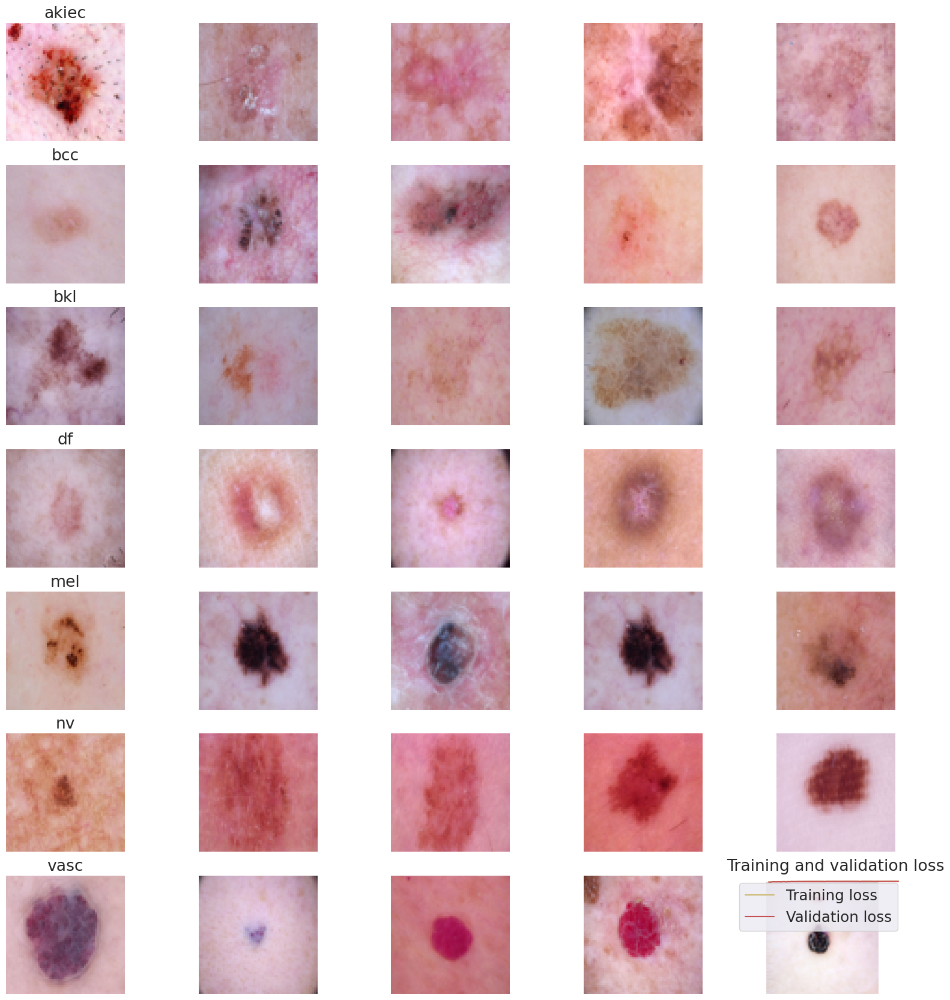

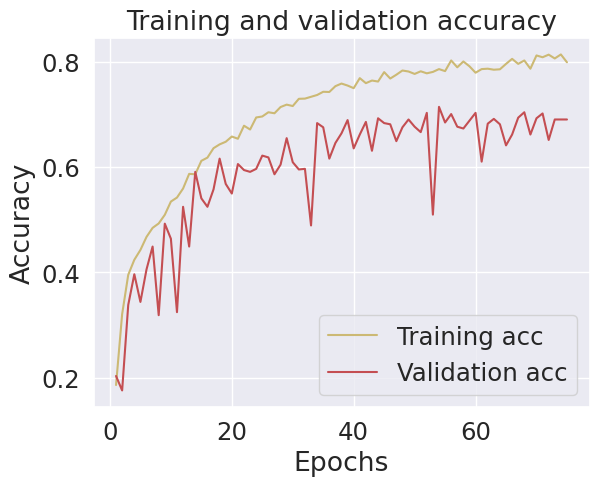

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


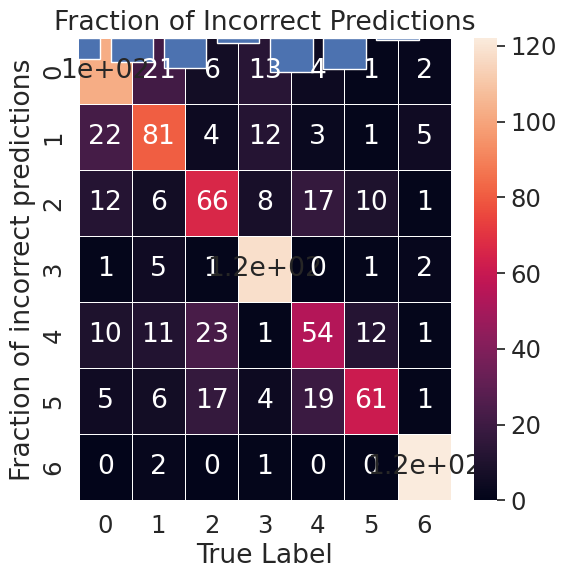

In [14]:
#size=64,batch size=20,epochs=75,optimizer='rmsprop',Loss Function='cosine_similarity'
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
from sklearn.utils import resample  # Added this import

np.random.seed(42)
from sklearn.metrics import confusion_matrix

import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

skin_df = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

SIZE = 64

# Label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
print(list(le.classes_))

skin_df['label'] = le.transform(skin_df["dx"])
print(skin_df.sample(10))

# Data distribution visualization
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type')

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex')

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count', size=12)
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.histplot(sample_age['age'], kde=True, color='red', bins=30)
ax4.set_title('Age')

plt.tight_layout()
plt.show()

# Balancing data
n_samples = 500
df_balanced = []
for label in range(7):
    df_label = skin_df[skin_df['label'] == label]
    df_balanced.append(resample(df_label, replace=True, n_samples=n_samples, random_state=42))

skin_df_balanced = pd.concat(df_balanced)
print(skin_df_balanced['label'].value_counts())

# Reading images based on image ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x
               for x in glob(os.path.join('/kaggle/input/skin-cancer-mnist-ham10000/', '*', '*.jpg'))}

skin_df_balanced['path'] = skin_df_balanced['image_id'].map(image_path.get)

# Check for missing paths
missing_paths = skin_df_balanced[skin_df_balanced['path'].isnull()]
if not missing_paths.empty:
    print("Missing image paths for the following image IDs:")
    print(missing_paths['image_id'])

# Use the path to read images, handling None values
def load_image(x):
    if x is not None and os.path.exists(x):
        try:
            img = Image.open(x).resize((SIZE, SIZE))
            return np.asarray(img)
        except Exception as e:
            print(f"Error loading image {x}: {e}")
            return np.zeros((SIZE, SIZE, 3))
    else:
        return np.zeros((SIZE, SIZE, 3))  # Return a zero array for missing images

skin_df_balanced['image'] = skin_df_balanced['path'].map(load_image)

# Rest of the code remains the same...
# (Training, model definition, etc.)
# Check if images are loaded correctly
for i, img in enumerate(skin_df_balanced['image'][:5]):
    if img.sum() == 0:
        print(f"Image {i} is black (all zeros)")
    else:
        print(f"Image {i} shape: {img.shape}")

# Plotting
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
for n_axs, (type_name, type_rows) in zip(m_axs, skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

# Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X / 255.  # Scale values to 0-1
Y = skin_df_balanced['label']
Y_cat = to_categorical(Y, num_classes=7)

# Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

# Define the model
model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Flatten())

model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

model.compile(loss='cosine_similarity', optimizer='rmsprop', metrics=['acc'])

# Train the model
batch_size = 20
epochs = 75

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_test, y_test),
    verbose=2)

score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

# Plotting training and validation accuracy and loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(loss) + 1)
plt.plot(epochs_range, loss, 'y', label='Training loss')
plt.plot(epochs_range, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs_range, acc, 'y', label='Training acc')
plt.plot(epochs_range, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Prediction on test data
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

# Plot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')
plt.title('Fraction of Incorrect Predictions')
plt.show()